In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
import sys 
import os

import torch
import torch.nn as nn

import pandas as pd

import ase

import time
import argparse

from models.descriptors import DihedralDescriptors, DistanceDescriptors

from models.basis_set_bias import BasisBias
from simulator.simple_diff_md import simulateNVTSystem, simulateNVTSystem_adjoint, simulateNVTSystem_warmup
from simulator.descriptor_loss import DescriptorLoss

from simulator.trainer import train_epoch

from simulator.adjoint_provider import get_adjoints

from models.gaussian_models import GridGaussians

from scipy.stats import chi2

from plotting.plot_intermediate import plot_intermediate

parser = argparse.ArgumentParser()
parser.add_argument("--seed", default=42, type=int, help="Random seed.")
parser.add_argument('--save_figs', action='store_true')
parser.add_argument('--no_adjoint', action='store_true')
parser.add_argument("--plot_every", default=1, type=int, help="When to plot figures.")

# Main simulation parameters
# Descriptor loss
parser.add_argument("--iterations", default=10000, type=int, help="Number of iterations to generate training data.")
parser.add_argument("--warmup", default=1200, type=int, help="Warm-up period for the trajectory termalization")
parser.add_argument("--backsteps", default=190, type=int, help="Number of backsteps. Must be smaller as warmup")
parser.add_argument("--plot_nth", default=100, type=int, help="Plotting every nth point.")


parser.add_argument("--batch_size", default=300, type=int, help="Batch size.")
parser.add_argument("--epochs", default=300, type=int, help="Number of training epochs.")
parser.add_argument("--save_steps", default=1, type=int, help="When to save tensor")
parser.add_argument("--dt", default=1.0, type=float, help="Timestep in fs")
parser.add_argument("--barrier", default=1.0, type=float, help="Barier size.")
parser.add_argument("--bias", default="descriptor_basis", type=str, help="Biased potential")
parser.add_argument("--dimension", default=5, type=int, help="Biased potential")
parser.add_argument("--neurons", default=150, type=int, help="Neurons in a net")
parser.add_argument("--loss", default="quad", type=str, help="Quadratic function")
parser.add_argument("--p_in_domain", default=0.1, type=float, help="Tolerance to it the target. Multiple of variance")

#Simulation controls
parser.add_argument("--temperature", default=300, type=float, help="System temperature.")
parser.add_argument("--gamma", default=0.1, type=float, help="Friction in langevin.")

#Training parameters
parser.add_argument("--learning_factor", default=3, type=float, help="Learning rate.")
parser.add_argument("--mini_batch", default=120, type=int, help="Mini batch")
parser.add_argument('--use_non_batched', action='store_true')
parser.add_argument('--device', default="cuda:2", type=str, help="Which device to use. CPU or GPU?")
parser.add_argument('--save_every_model', default=1, type=int, help="When to save the bias potential")
args = parser.parse_args("")

args.save_figs = True

/home/sipkam/anaconda3/envs/torchmdCUDA/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
#Define som runtimes stuff
if args.bias == "distance_basis":
    args.eps = args.eps/100
    
if args.save_steps > 1:
    raise NotImplemented("Feature not yet implemented and tested")

args.warmup = args.warmup//args.save_steps
args.backsteps = args.backsteps//args.save_steps

args.domain_tol = chi2.isf(args.p_in_domain, args.dimension)

#The numerical stability factor. Adjoints tend to be too small and numerical accuracy is an issue. 
adjoint_multiplier = 1e4


assert args.iterations > 3* args.warmup
assert args.backsteps < args.warmup
torch.manual_seed(args.seed)

if args.no_adjoint:
    forward_simulate = simulateNVTSystem
else:
    forward_simulate = simulateNVTSystem_adjoint


first_checkpoint = False
first_thr = 0.51
second_checkpoint = False
second_thr = 0.71
#third_checkpoint = True
#fourth_checkpoint = True


args.folder = "resultsAla2/"+args.bias+ "D" + str(args.dimension)+"p:"+str(args.p_in_domain)+"I:" \
    + str(args.iterations) \
    + "N"+ str(args.neurons) + "dt" + str(args.dt) + "T" + str(args.temperature) + "g" \
    + str(args.gamma) +"/"
isExist = os.path.exists(args.folder)

if not isExist and (args.save_figs or args.save_every_model > 0):
    os.makedirs(args.folder)
    print("making folder")

In [3]:
#Cell to design descriptors. Choose their type, periodicty and ranges. 

if args.dimension == 2:
    project_to = torch.tensor([0,1])
elif args.dimension == 5:
    project_to = torch.tensor([0,2])

#omega1, phi, psi, omega2, xi    
indices_dihedral = torch.tensor([
    [4,6,8,14],      #Phi
    [6,8,14,16],     #Psi
    [1,4,6,8],       #Omega 1
    [8,14,16,18],    #Omega 2
    [4,6,8,10]]).T   #Xi

indices_distance = torch.tensor([
    [1,18],  #Far C-C
    [1,16],  #far C-N
    [1,14],  #closer C-C
    [1,8],   #Backbone C-C
    [4,18],  #far C-C
    [4,16],  #closer C-N
    [4,14],  #close C-C
    [4,8],   #Backbone C-C
    [6,18],  #Far N-C
    [6,16],  # N-N 
    [6,14],  #close N-C
    [6,8],   #close N-C neigh
    #Include balast?
    [1,4],   
    [4,6],  
    [14,16],  
    [8,14],  
    [16,18],   
]).T




if args.bias == "dihedral_basis":   
    indices_dihedral = indices_dihedral[...,0:args.dimension]
    
if args.bias == "distance_basis":   
    indices_distance = indices_distance[...,0:args.dimension]
    #This part is just for plotting. These are known CVs for ala2 case. 
    indices_dihedral = indices_dihedral[...,0:2]
    

project_to = [0,1]
dihedral_descriptors = DihedralDescriptors(indices_dihedral, cv_index=project_to)
    
domain = {}
domain["Lx"], domain["Hx"] = -np.pi, np.pi
domain["Ly"], domain["Hy"] = -np.pi, np.pi
domain["res"] = 100

In [4]:
#Molecule loading and setup

from moleculekit.molecule import Molecule

#possible ase visualisation
import ase.io
from ase.visualize import view
from ase import Atoms

testdir = "data/ala2nowater/"

reactants = Molecule(os.path.join(testdir, "ala2nw.prmtop"))  # Reading the system topology
reactants.read(os.path.join(testdir, "reactants.coor"))  # Reading the initial simulation coordinates
reactants.read(os.path.join(testdir, "input.xsc"))  # Reading the box dimensions
reactants.center(loc=(10.0,10.0,10.0))

products = Molecule(os.path.join(testdir, "ala2nw.prmtop"))  # Reading the system topology
products.read(os.path.join(testdir, "products.coor"))  # Reading the initial simulation coordinates
products.read(os.path.join(testdir, "input.xsc"))  # Reading the box dimensions
products.center(loc=(10.0,10.0,10.0))



asemol = ase.io.read(os.path.join(testdir, "ala2.pdb"))
asemol.positions = reactants.coords.reshape(-1,3)
asemol.cell = reactants.box.reshape(3,)
asemol.pbc=True

#view(asemol)

In [5]:
#This is a forcefield setup

from torchmd.forcefields.forcefield import ForceField
from torchmd.parameters import Parameters
from simulator.system import System
from models.sample_forces import SampleForces
from functorch import vmap, jvp, vjp, grad

precision = torch.float

#Using all terms for the calculation
terms_to_use = SampleForces.terms

#Initialize the system and get ready
system = System(reactants.numAtoms, nreplicas=2*args.batch_size, precision=precision, device=args.device)
ff = ForceField.create(reactants, os.path.join(testdir, "ala2nw.prmtop"))
parameters = Parameters(ff, reactants, precision=precision, device=args.device)
parameters.mapped_atom_types = parameters.mapped_atom_types.to(args.device)
sample_forces = SampleForces(parameters, system.box, terms=terms_to_use)
system.M = sample_forces.par.masses.unsqueeze(0)

#Assign Coordinates
r_coords = torch.tensor(reactants.coords).repeat(1,1,args.batch_size)
p_coords = torch.tensor(products.coords).repeat(1,1,args.batch_size)
init_coordinates = torch.cat((r_coords,p_coords),dim=2)
init_coordinates_batchfirst = torch.permute(init_coordinates.detach(),(2,0,1))



In [6]:
#Define initialization and setup the run

from simulator.utils import maxwell_boltzmann, kinetic_energy, kinetic_to_temp, temp_to_kin

desired_kin = temp_to_kin(300, 3*system.M.shape[1])
    
def get_init_point(steps = 300):

    system.set_positions(init_coordinates.detach())
    system.set_box(reactants.box)
    system.set_velocities(maxwell_boltzmann(system.M, args.temperature, 3*system.M.shape[1], replicas=2*args.batch_size))
    kin = kinetic_energy(system.M, system.vel)
    factor = torch.sqrt(desired_kin/kin).reshape(-1,1,1).repeat(1,system.M.shape[1],1)
    system.vel = system.vel*factor

    system.to_(args.device)
    #Pass a vmap on the non-biased forces
    simulateNVTSystem_warmup(system, vmap(sample_forces.compute), args, steps=steps)
    
    kin = kinetic_energy(system.M, system.vel)

    start, end = system.pos.detach().chunk(2,dim=0)
    return system, torch.cat((start, end)), torch.cat((end, start))


get_init_point(10)
#Pass a vmap on a non-biased force
pos_list = simulateNVTSystem_warmup(system, vmap(sample_forces.compute), args, steps=1200)
#Stack the list of points and split into reactant trajs and product trajs
pos_list = torch.stack(pos_list, axis=1)
react_pos = pos_list[:args.batch_size]
prod_pos = pos_list[args.batch_size:]




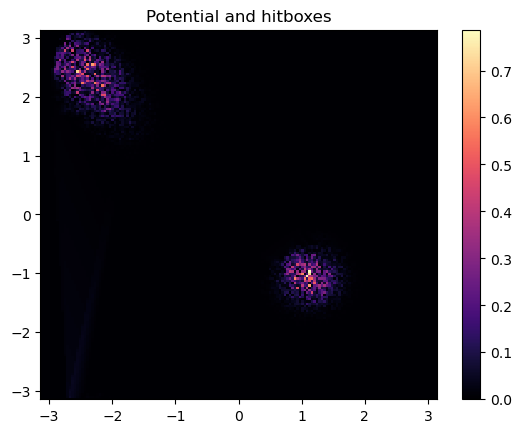

tensor([[[ 255.4127,   14.2540,    6.1377,    5.2852, -250.3726],
         [  14.2540,    7.8436,    5.8220,    1.1345,   -9.1777],
         [   6.1377,    5.8220,   67.5311,   -0.6633,   -0.7023],
         [   5.2852,    1.1345,   -0.6633,   60.9136,   -4.1258],
         [-250.3726,   -9.1777,   -0.7023,   -4.1257,  255.2328]]])


In [7]:
#Get initial descriptors and estimate variance in them. 
from scipy.interpolate import griddata

reactant_target = torch.tensor(reactants.coords).permute(2,0,1)
product_target = torch.tensor(products.coords).permute(2,0,1)
reactant_dihedrals = dihedral_descriptors.metric_from(react_pos.reshape((-1,*react_pos.shape[-2:])), reactant_target)
product_dihedrals = dihedral_descriptors.metric_from(prod_pos.reshape((-1,*prod_pos.shape[-2:])), product_target)

r_d = dihedral_descriptors.get_descriptors(react_pos.reshape((-1,*react_pos.shape[-2:])))
p_d = dihedral_descriptors.get_descriptors(prod_pos.reshape((-1,*prod_pos.shape[-2:])))

#Get the normal distribution covariance matrix
react_cov = torch.cov(reactant_dihedrals.T)
prod_cov = torch.cov(product_dihedrals.T)

#Invert it. We are only inverting once in the runtime. 
react_var_inv = torch.inverse(react_cov).unsqueeze(0)
prod_var_inv = torch.inverse(prod_cov).unsqueeze(0)


Lx,Ly = -np.pi, -np.pi
Hx,Hy = np.pi, np.pi
resolution = 160

x, y = torch.meshgrid(torch.linspace(Lx, Hx, resolution), torch.linspace(Ly, Hy, resolution), indexing='ij')


summ_r = (reactant_dihedrals.unsqueeze(1) @ react_var_inv @ reactant_dihedrals.unsqueeze(2)).squeeze()
prod_r = torch.exp(-1/2*summ_r)
points_r = r_d[:,project_to].detach().cpu()
z_r = griddata(points_r, prod_r, (x, y), method='linear',fill_value=0.0)

summ_p = (product_dihedrals.unsqueeze(1) @ prod_var_inv @ product_dihedrals.unsqueeze(2)).squeeze()
prod_p = torch.exp(-1/2*summ_p)
points_p = p_d[:,project_to].detach().cpu()

z_p = griddata(points_p, prod_p, (x, y), method='linear',fill_value=0.0)

c_bias = plt.pcolormesh(x, y, z_r+z_p, cmap='magma', shading='auto')
plt.title('Potential and hitboxes')
plt.axis([Lx, Hx, Ly, Hy])
plt.colorbar(c_bias)
plt.show()

print(react_var_inv)

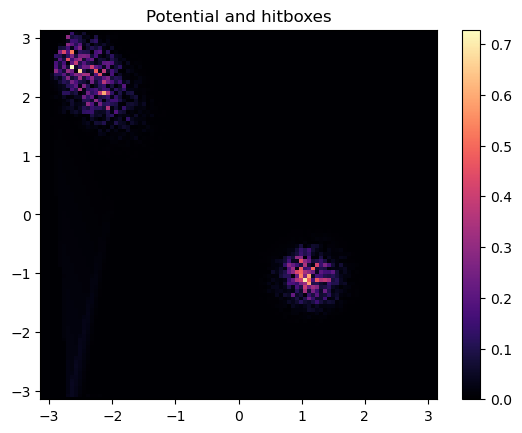

tensor([[[ 255.4127,   14.2540,    6.1377,    5.2852, -250.3726],
         [  14.2540,    7.8436,    5.8220,    1.1345,   -9.1777],
         [   6.1377,    5.8220,   67.5311,   -0.6633,   -0.7023],
         [   5.2852,    1.1345,   -0.6633,   60.9136,   -4.1258],
         [-250.3726,   -9.1777,   -0.7023,   -4.1257,  255.2328]]])


In [8]:
#Get initial descriptors and estimate variance in them. 
from simulator.cov_estimator import get_covariance

reactant_target = torch.tensor(reactants.coords).permute(2,0,1)
product_target = torch.tensor(products.coords).permute(2,0,1)
#Get initial descriptors and estimate variance in them. 



react_var_inv, prod_var_inv = get_covariance(react_pos, prod_pos, reactant_target, product_target,
                                             dihedral_descriptors, domain, args)
print(react_var_inv)

In [9]:
if args.bias == "gauss":
    var = (np.pi/10)**2
    ranges = [[-np.pi, np.pi],[-np.pi, np.pi]]
    resolution = [10,10]
    sample_bias_force = GridGaussians(1.3, args.dimension, ranges, resolution, var=var, descriptors=get_descriptors, device=args.device)
    if args.use_non_batched or args.no_adjoint:
        lr = 0.1/adjoint_multiplier
    else:
        lr = 1/adjoint_multiplier
        
if args.bias == "descriptor_basis":   
    
    height = 1.3
    resolution = 50
    var = (np.pi/10)**2
    sample_bias_force = BasisBias(height,args.dimension, -np.pi, np.pi,
                                       resolution=resolution, var=var, neurons=args.neurons,
                                       descriptors=dihedral_descriptors, device=args.device)
    if args.use_non_batched or args.no_adjoint:
        lr = 0.1/adjoint_multiplier
    else:
        lr = args.learning_factor/adjoint_multiplier/args.batch_size    
       
    
    
sample_bias_force.to(args.device)
   
#Adam optimizer seems to work the best
optimizer = torch.optim.Adam(sample_bias_force.parameters(), lr=lr)

#Since we update scheduler only 
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.3)

#Descriptors
descriptor_loss = DescriptorLoss(dihedral_descriptors, react_var_inv, prod_var_inv, args, traj_loss=False)

def sample_total_force(R):
       
    Epot, f_U = sample_forces.compute(R)   
    f_b = sample_bias_force.force_func(R)
    return f_U + f_b

def get_forces_vjp(R, vec):
    (_, vjpfunc) = vjp(sample_total_force, R)
    grad = vjpfunc(vec)[0]
    return grad


vmaped_force = vmap(sample_total_force)
vmaped_vjp = vmap(get_forces_vjp)

In [10]:
#Setup a logger
from torchmd.utils import LogWriter

logger = LogWriter(path=args.folder, keys=('iter','loss_fwd','loss_s','lr','success'), name='training.csv')

i = 0

Writing logs to  resultsAla2/descriptor_basisD5p:0.1I:10000N150dt1.0T300g0.1/training.csv


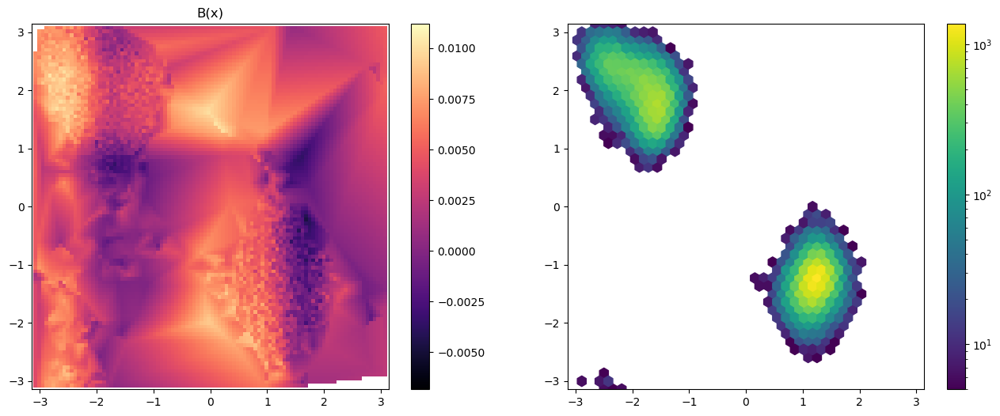

Iter:  1 l_f: 8570.2072 l_s: 21.0466921875 lr:  1e-06 success:  0.023333333


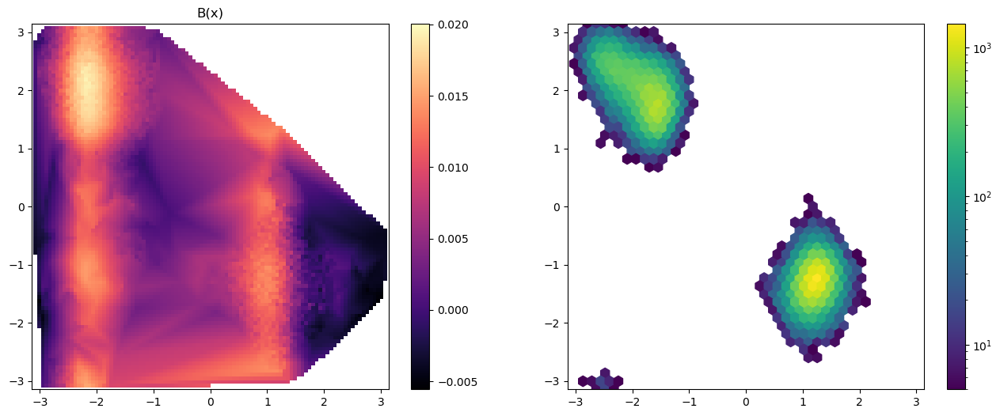

Iter:  2 l_f: 8505.004 l_s: 13.8175015625 lr:  1e-06 success:  0.02


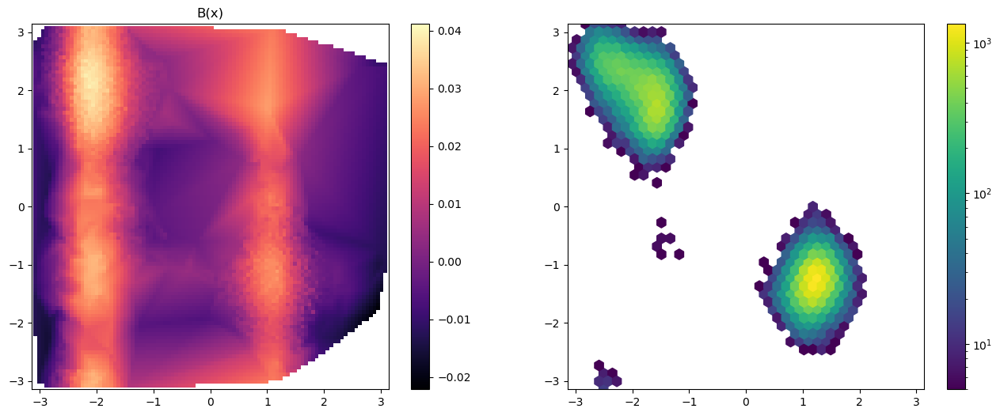

Iter:  3 l_f: 8466.5936 l_s: 13.393884375 lr:  1e-06 success:  0.023333333


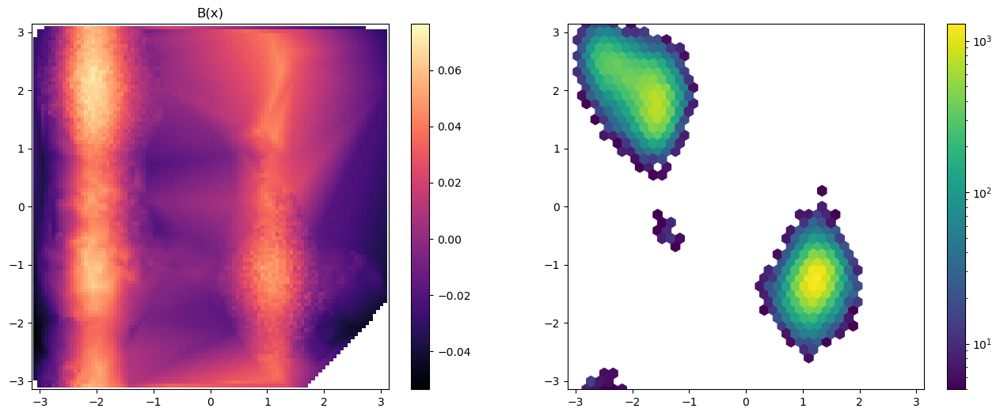

Iter:  4 l_f: 8361.8192 l_s: 9.72056796875 lr:  1e-06 success:  0.026666667


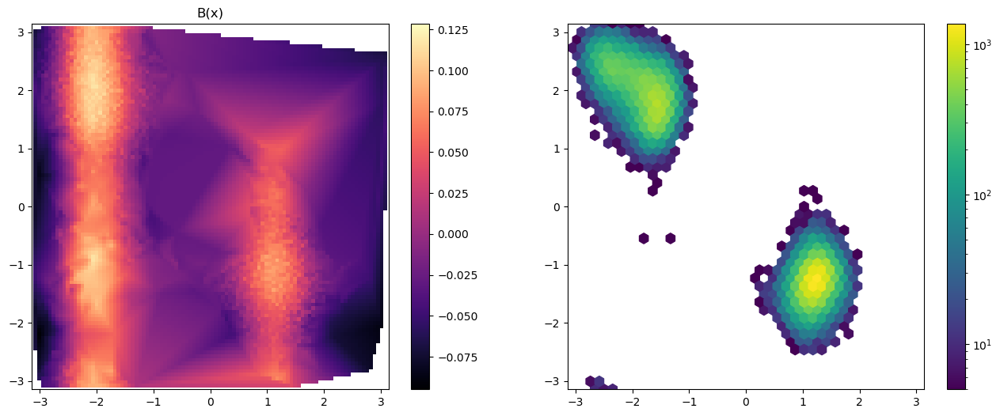

Iter:  5 l_f: 8479.0568 l_s: 16.9664453125 lr:  1e-06 success:  0.026666667


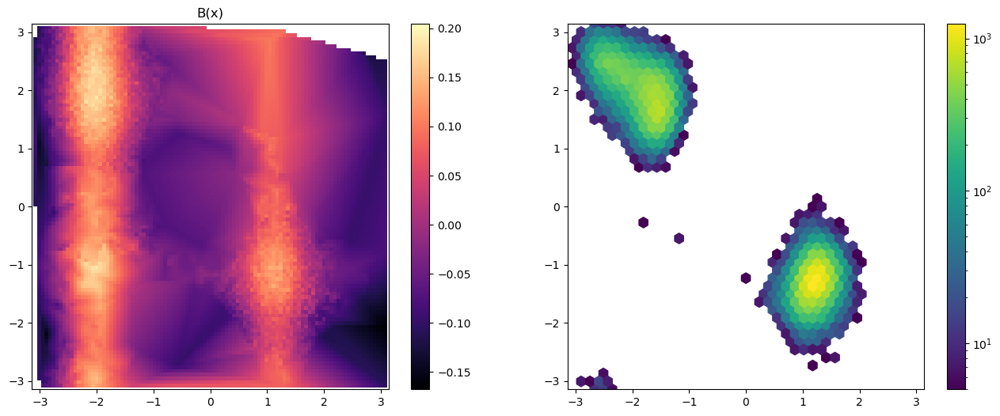

Iter:  6 l_f: 8138.8904 l_s: 45.288025 lr:  1e-06 success:  0.033333335


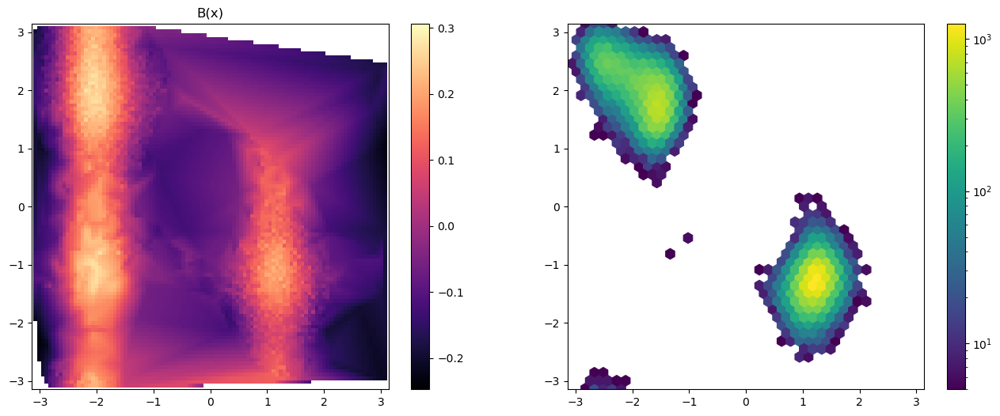

Iter:  7 l_f: 8145.9288 l_s: 7.87926171875 lr:  1e-06 success:  0.043333333


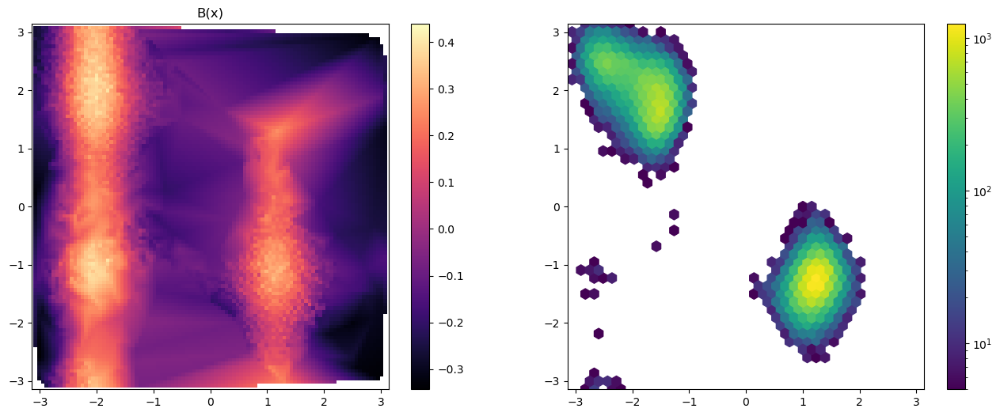

Iter:  8 l_f: 8126.632 l_s: 31.906909375 lr:  1e-06 success:  0.038333334


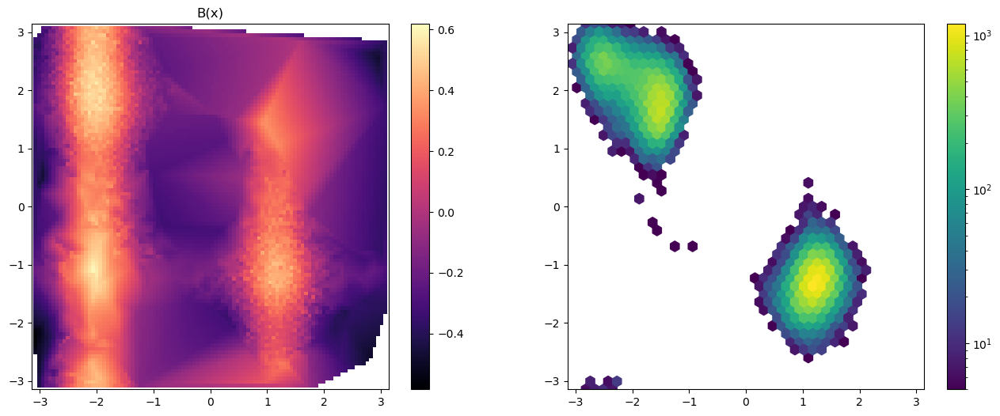

Iter:  9 l_f: 7971.1128 l_s: 22.3964875 lr:  1e-06 success:  0.04


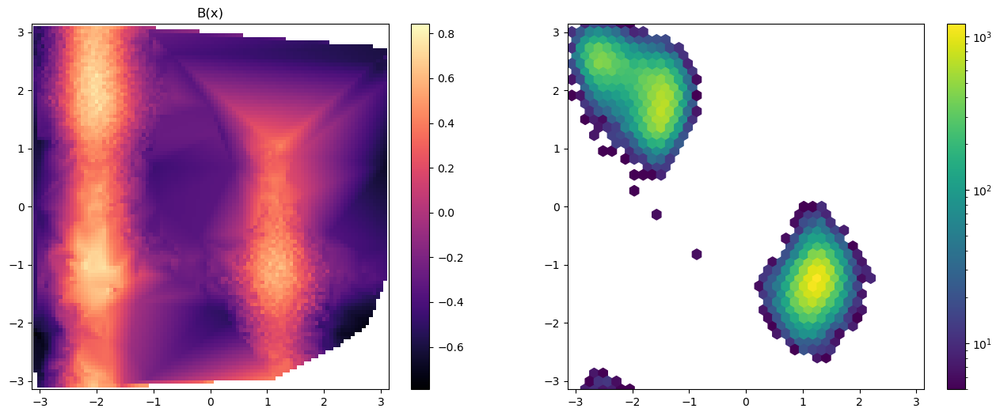

Iter:  10 l_f: 7756.2608 l_s: 15.1678453125 lr:  1e-06 success:  0.041666668


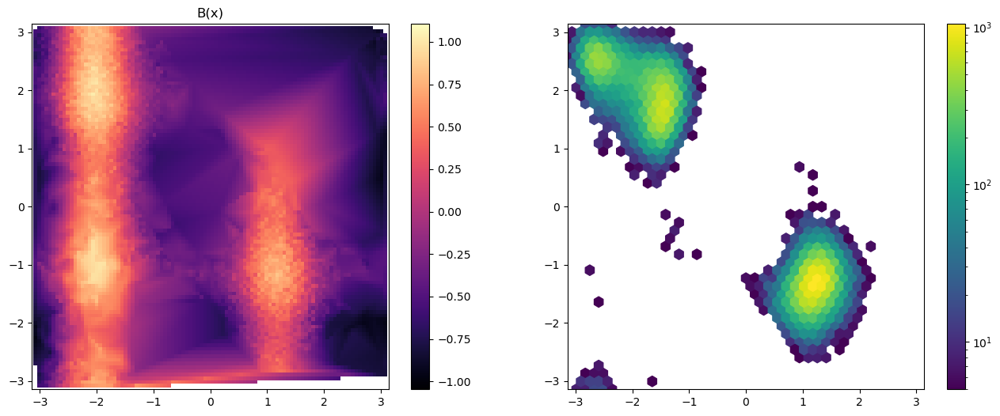

Iter:  11 l_f: 7435.0544 l_s: 44.640303125 lr:  1e-06 success:  0.061666667


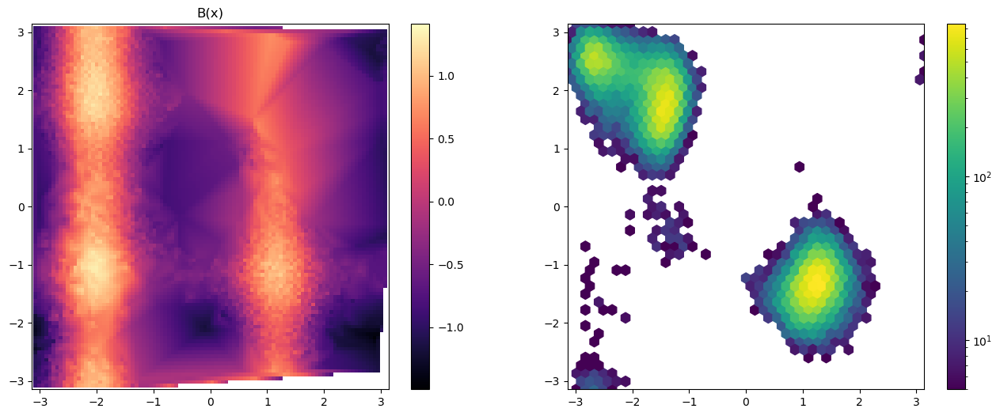

Iter:  12 l_f: 6979.0216 l_s: 68.6914375 lr:  1e-06 success:  0.10166667


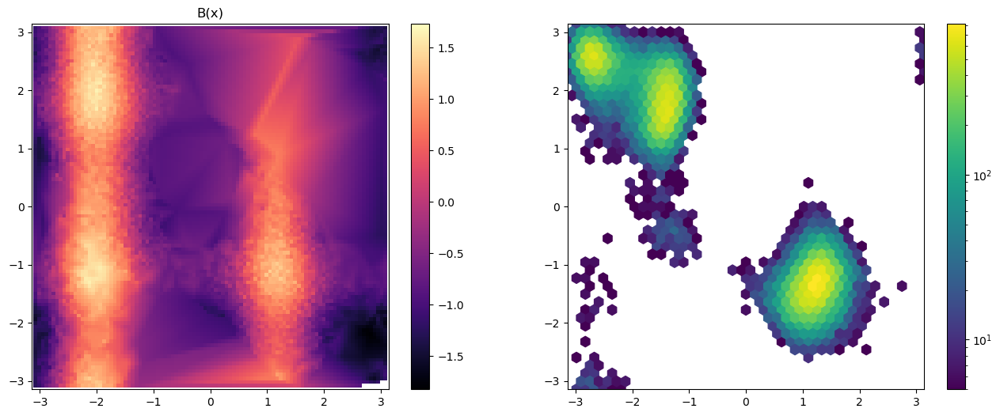

Iter:  13 l_f: 6711.3624 l_s: 65.0365 lr:  1e-06 success:  0.11666667


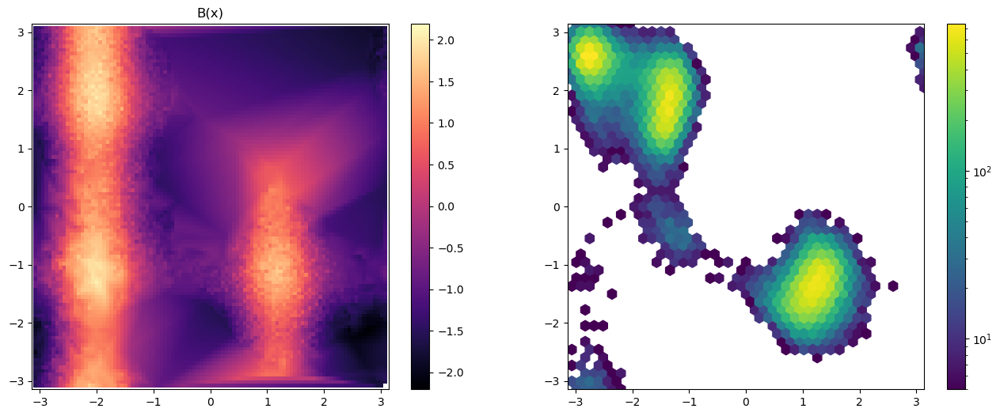

Iter:  14 l_f: 6411.3548 l_s: 140.5618125 lr:  1e-06 success:  0.14333333


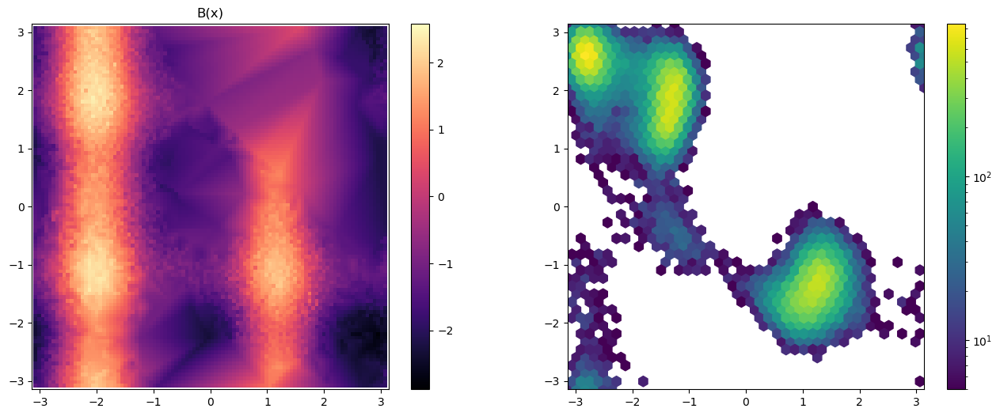

Iter:  15 l_f: 5402.45 l_s: 139.9147375 lr:  1e-06 success:  0.24333334


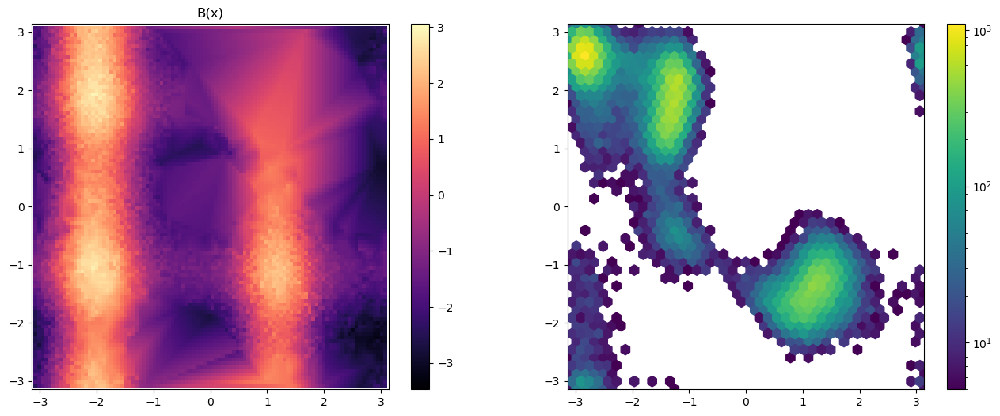

Iter:  16 l_f: 4862.4644 l_s: 234.997775 lr:  1e-06 success:  0.305


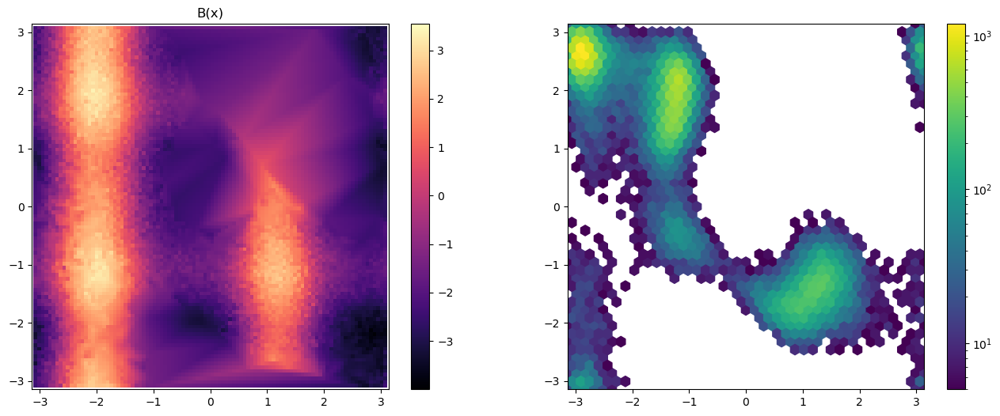

Iter:  17 l_f: 4173.8892 l_s: 327.471325 lr:  1e-06 success:  0.36166668


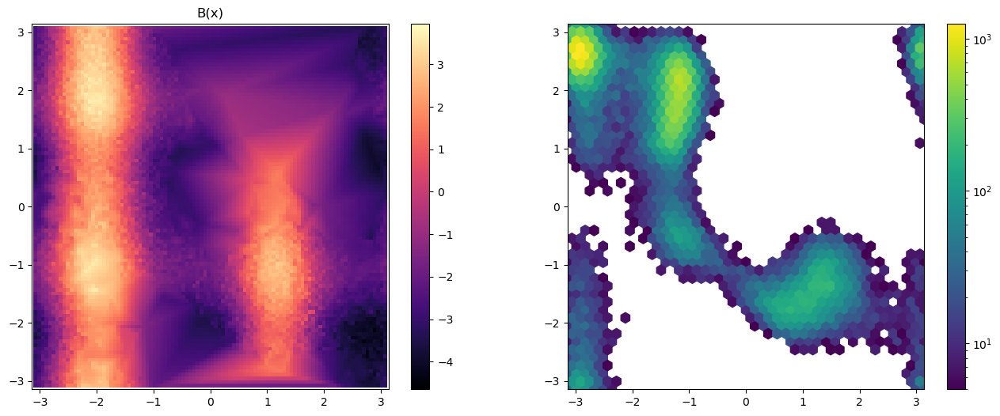

Iter:  18 l_f: 3665.5272 l_s: 553.1511 lr:  1e-06 success:  0.42833334


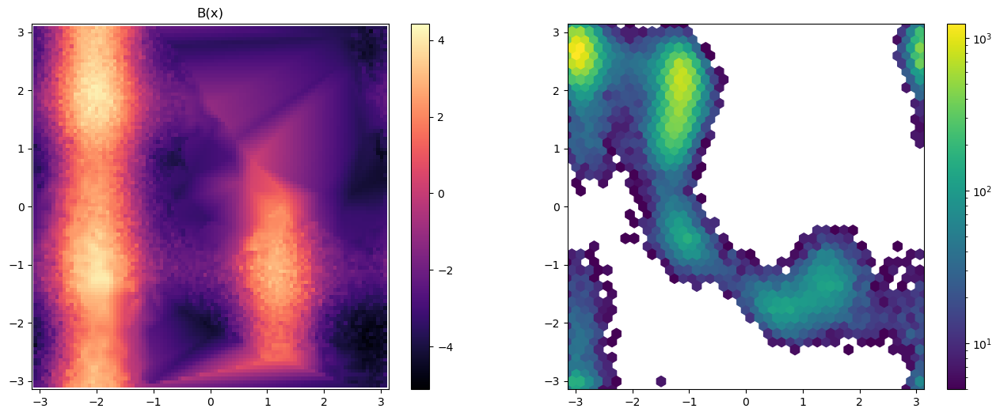

Iter:  19 l_f: 3234.4288 l_s: 709.76325 lr:  1e-06 success:  0.465


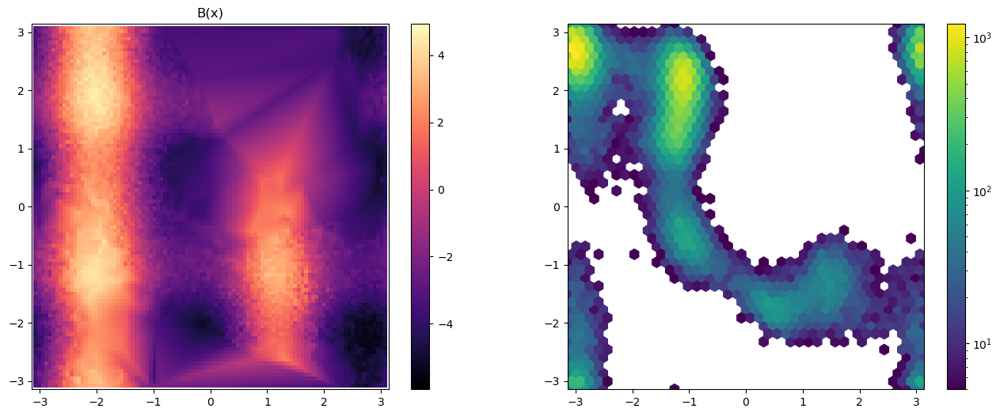

Iter:  20 l_f: 3072.6308 l_s: 1005.7819 lr:  1e-06 success:  0.48166665


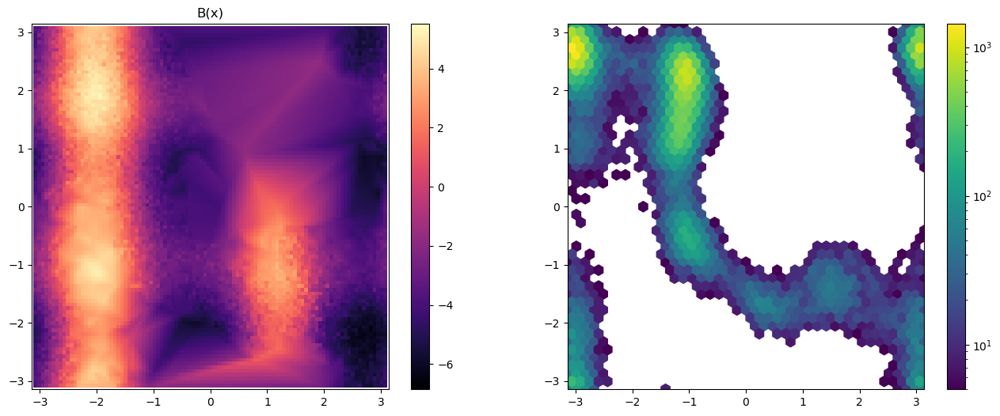

Iter:  21 l_f: 3030.6494 l_s: 1285.7505 lr:  1e-06 success:  0.46166667


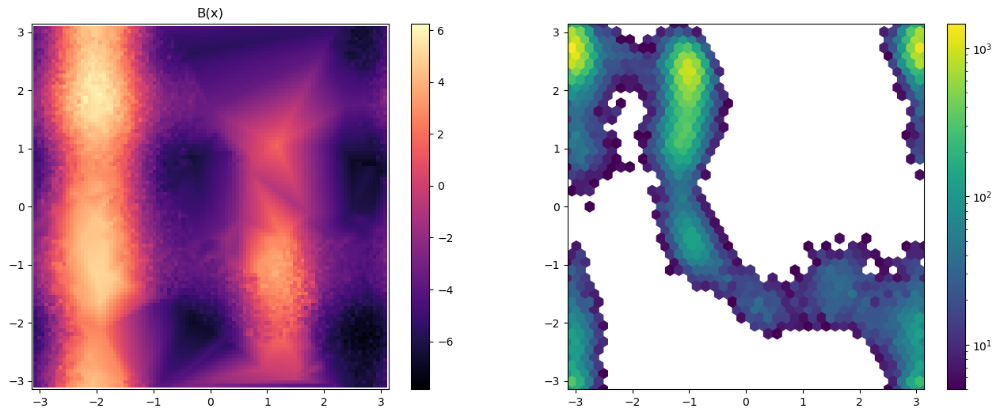

Iter:  22 l_f: 2795.8286 l_s: 1231.5481 lr:  1e-06 success:  0.445


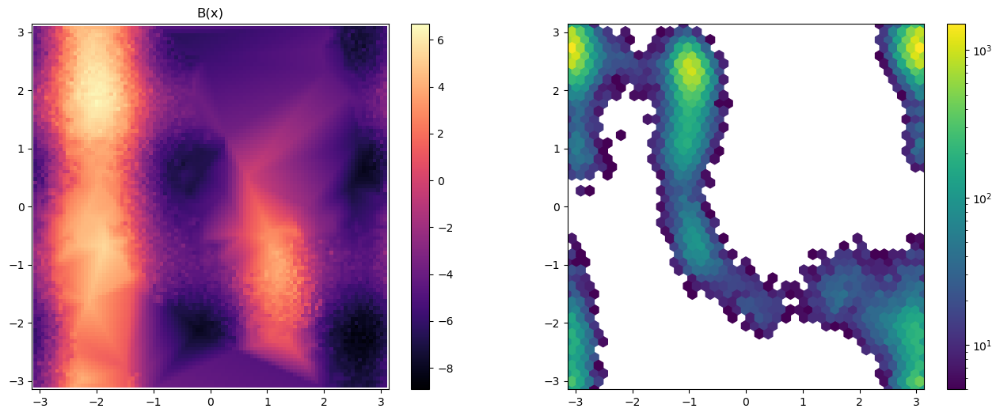

Iter:  23 l_f: 2401.3638 l_s: 1113.5667 lr:  1e-06 success:  0.44833332


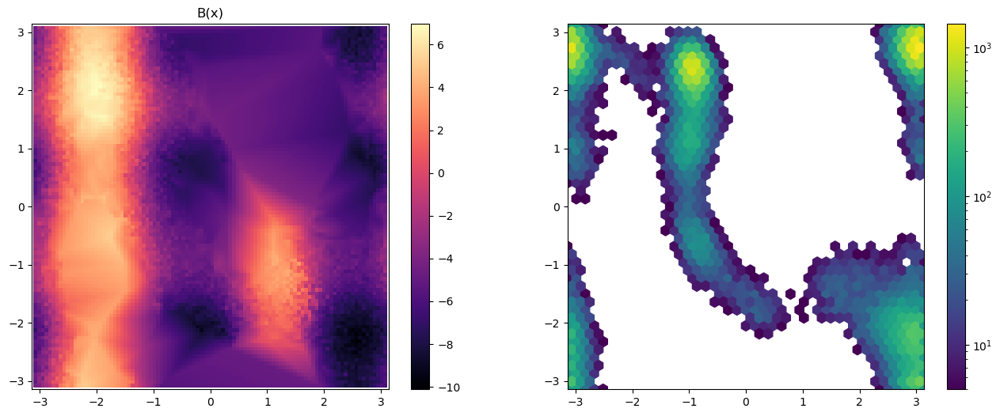

Iter:  24 l_f: 2257.2456 l_s: 868.2759 lr:  1e-06 success:  0.41833332


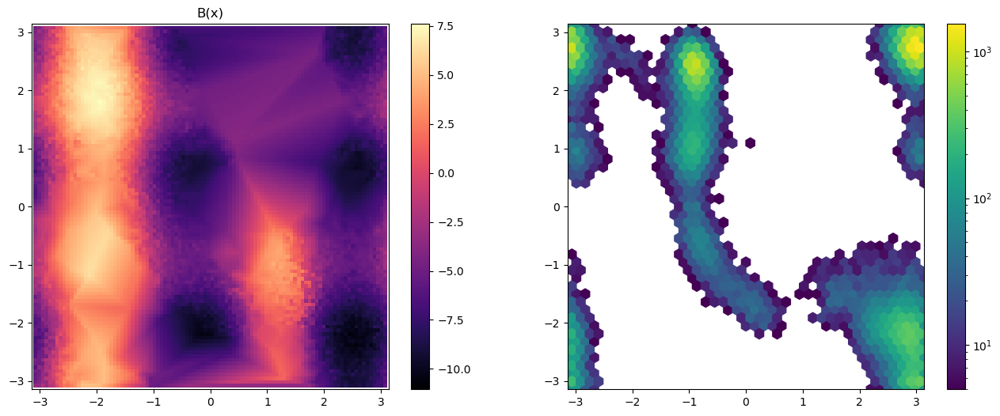

Iter:  25 l_f: 1998.933 l_s: 770.4508 lr:  1e-06 success:  0.4


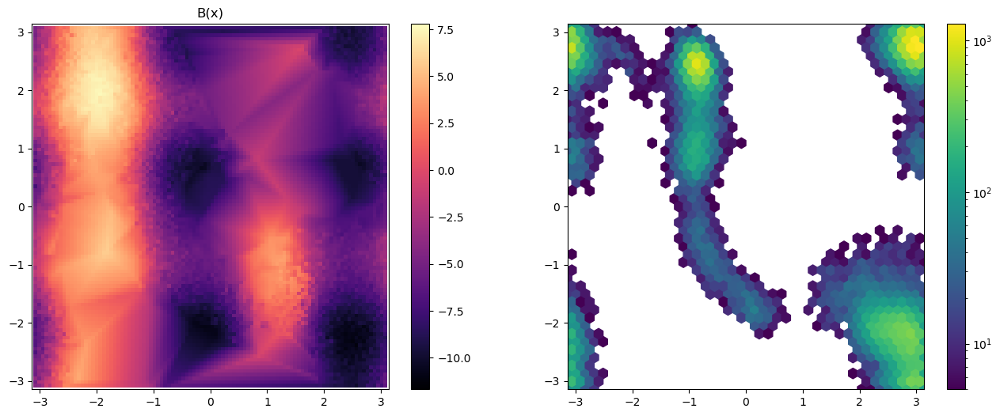

Iter:  26 l_f: 1796.097 l_s: 501.17875 lr:  1e-06 success:  0.40333334


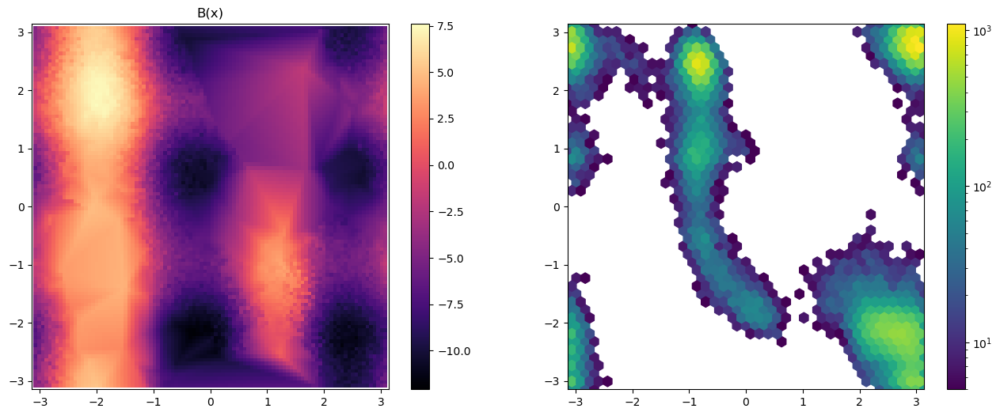

Iter:  27 l_f: 1468.7186 l_s: 452.0085 lr:  1e-06 success:  0.435


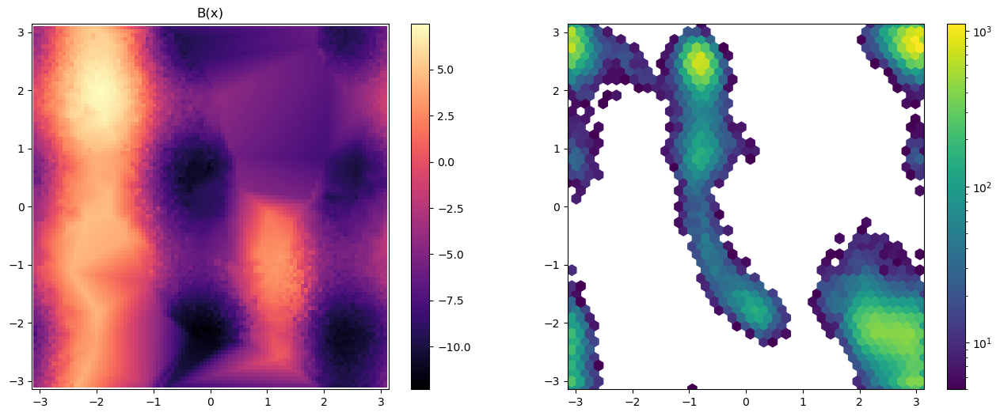

Iter:  28 l_f: 1363.4747 l_s: 341.8357 lr:  1e-06 success:  0.455


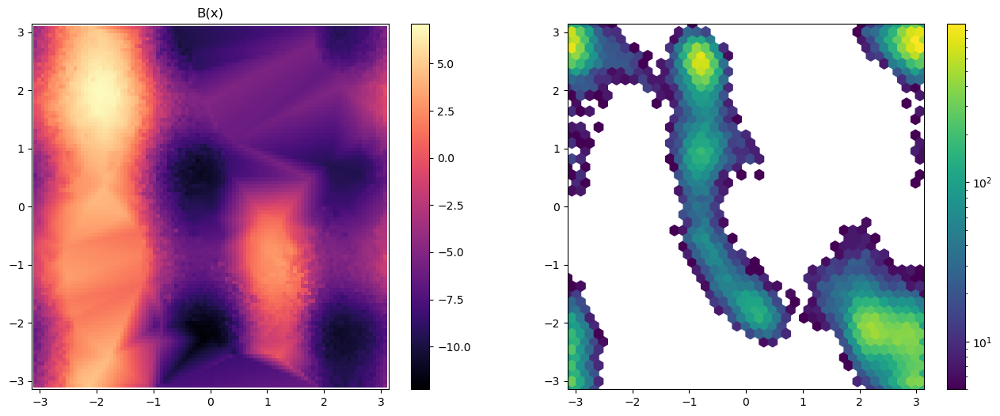

Iter:  29 l_f: 1326.5493 l_s: 315.614525 lr:  1e-06 success:  0.46333334


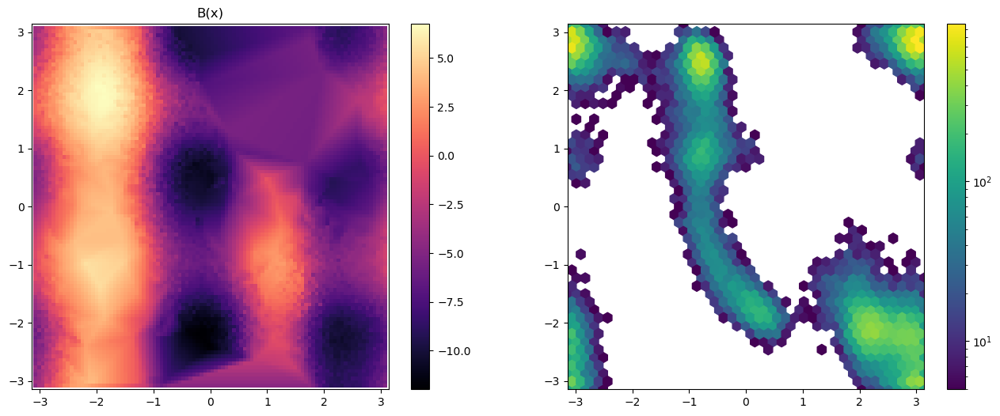

Iter:  30 l_f: 1080.4038 l_s: 358.4552 lr:  1e-06 success:  0.51666665


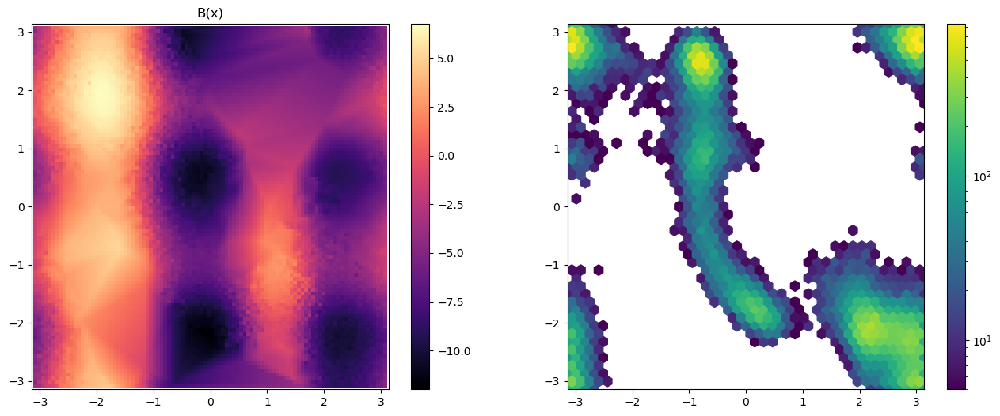

Iter:  31 l_f: 1221.6295 l_s: 343.50535 lr:  3e-07 success:  0.48166665


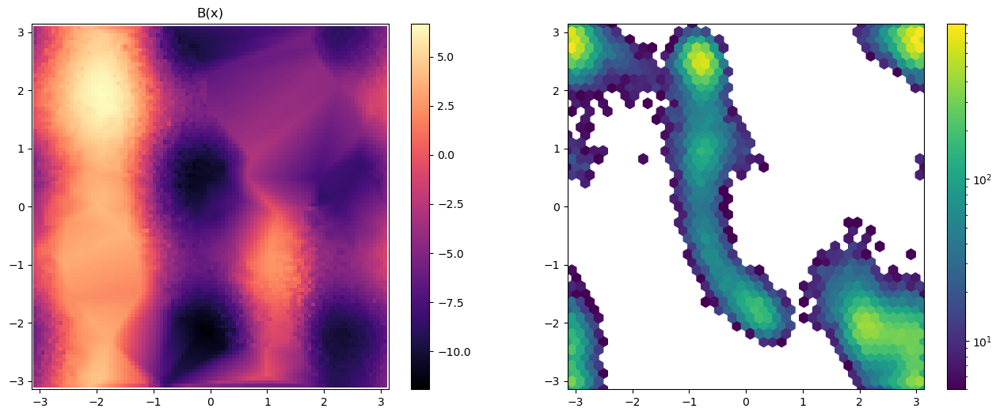

Iter:  32 l_f: 1087.9126 l_s: 356.41595 lr:  3e-07 success:  0.52666664


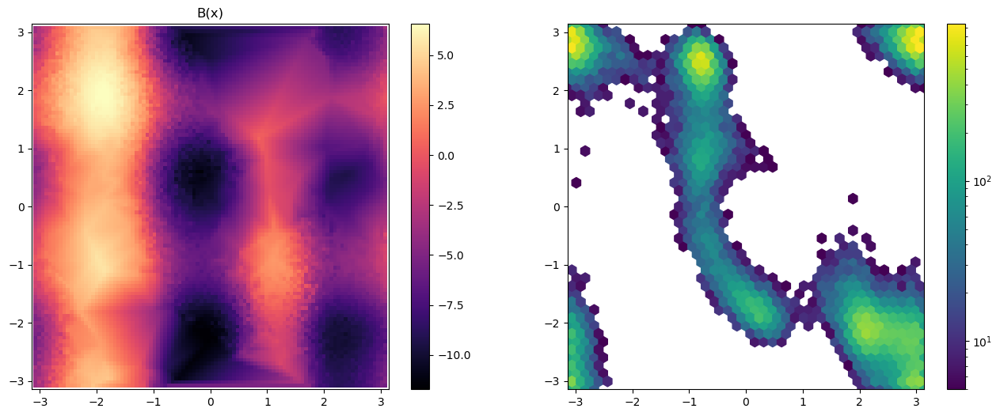

Iter:  33 l_f: 1127.1608 l_s: 336.997775 lr:  3e-07 success:  0.51666665


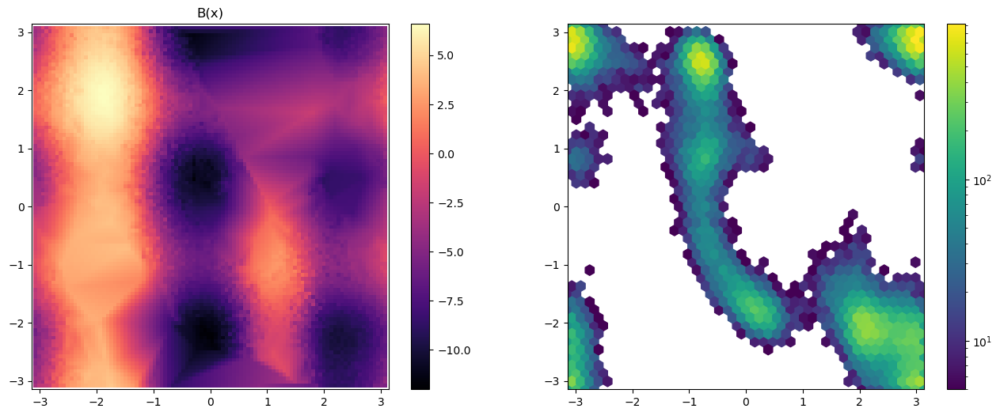

Iter:  34 l_f: 1099.0569 l_s: 305.36665 lr:  3e-07 success:  0.53


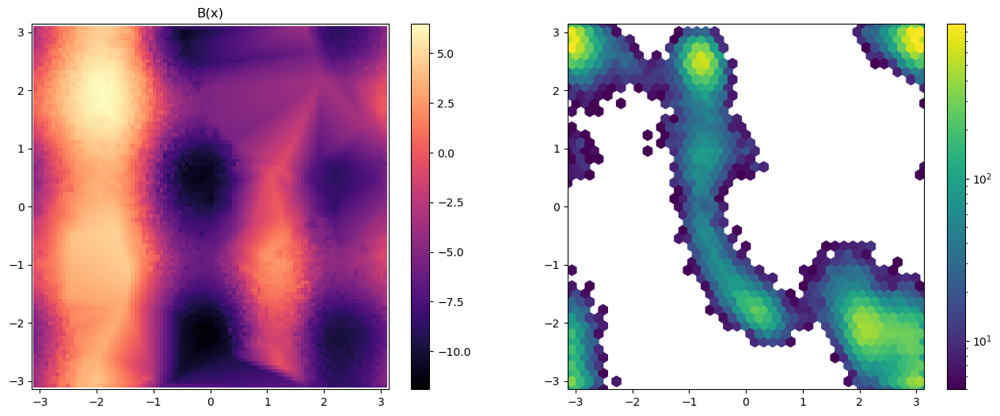

Iter:  35 l_f: 998.2309 l_s: 319.062625 lr:  3e-07 success:  0.5683333


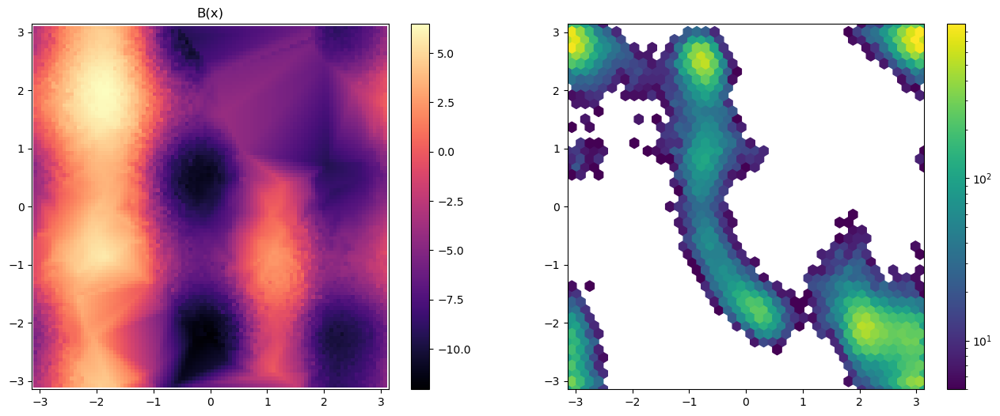

Iter:  36 l_f: 1033.4412 l_s: 350.219025 lr:  3e-07 success:  0.54333335


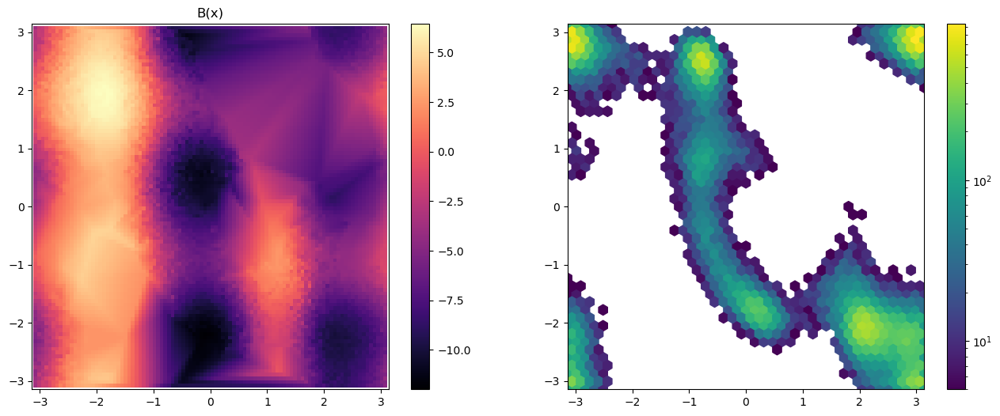

Iter:  37 l_f: 954.3141 l_s: 341.227175 lr:  3e-07 success:  0.5733333


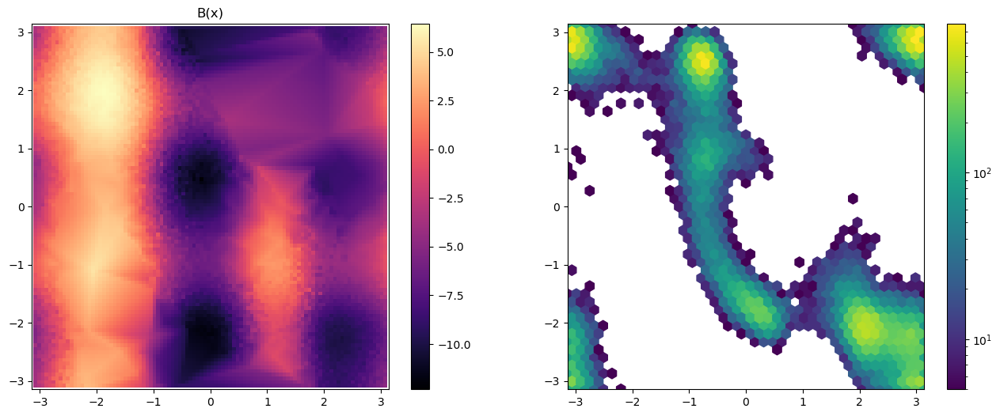

Iter:  38 l_f: 974.1722 l_s: 275.859075 lr:  3e-07 success:  0.5733333


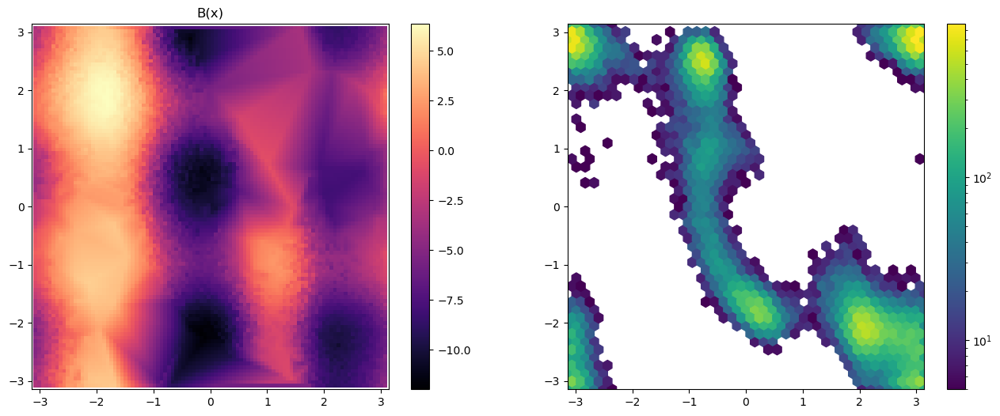

Iter:  39 l_f: 855.0462 l_s: 354.2944 lr:  3e-07 success:  0.58


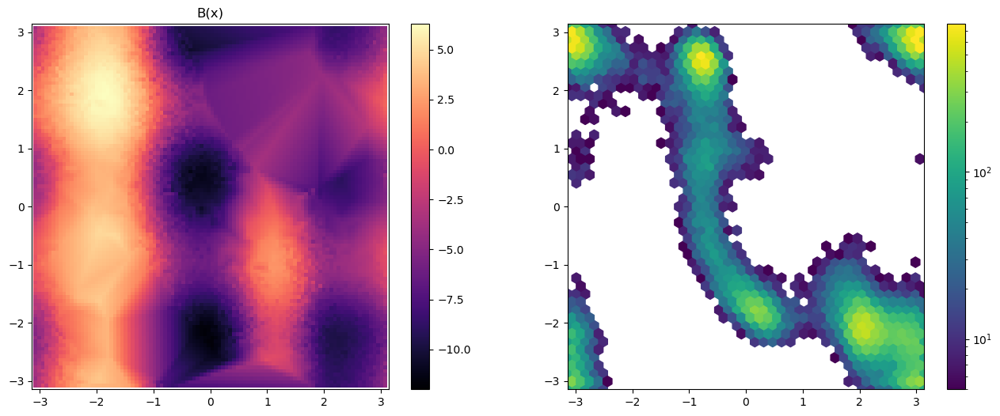

Iter:  40 l_f: 1001.5574 l_s: 357.99145 lr:  3e-07 success:  0.58666664


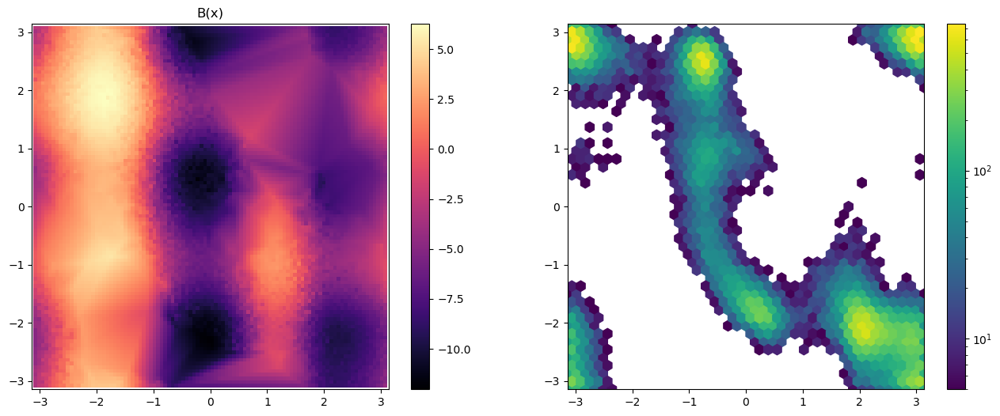

Iter:  41 l_f: 849.4733 l_s: 395.548525 lr:  3e-07 success:  0.59


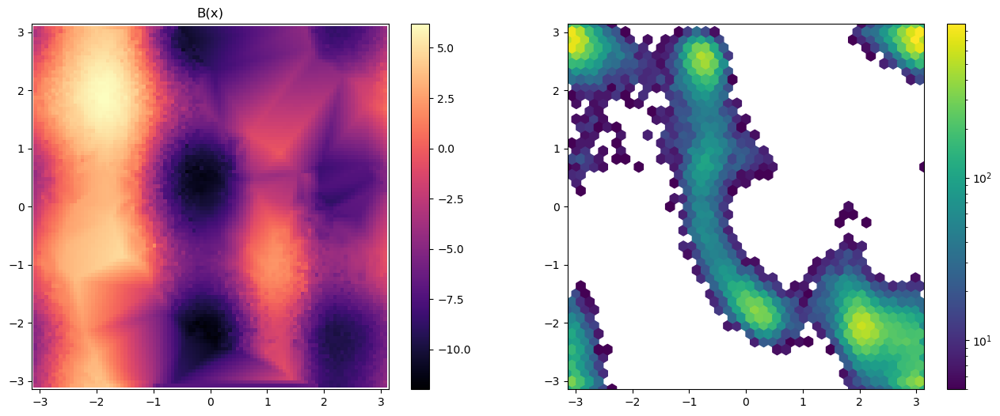

Iter:  42 l_f: 791.29915 l_s: 367.066375 lr:  3e-07 success:  0.61


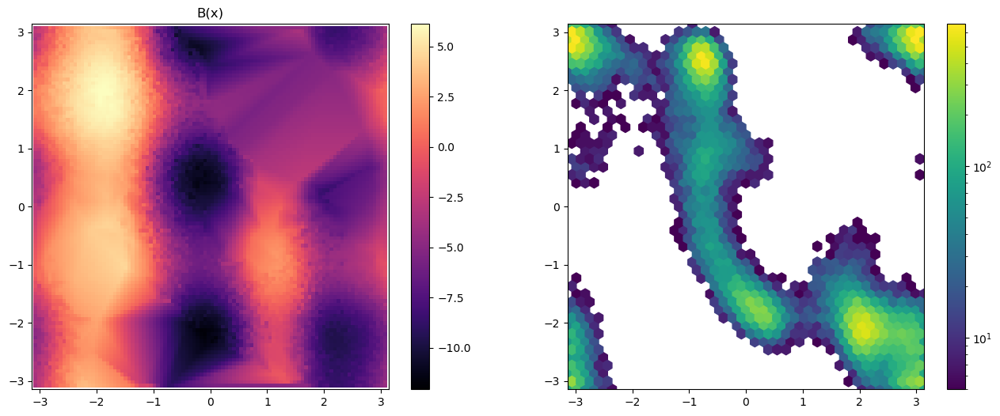

Iter:  43 l_f: 902.6864 l_s: 343.08905 lr:  3e-07 success:  0.61


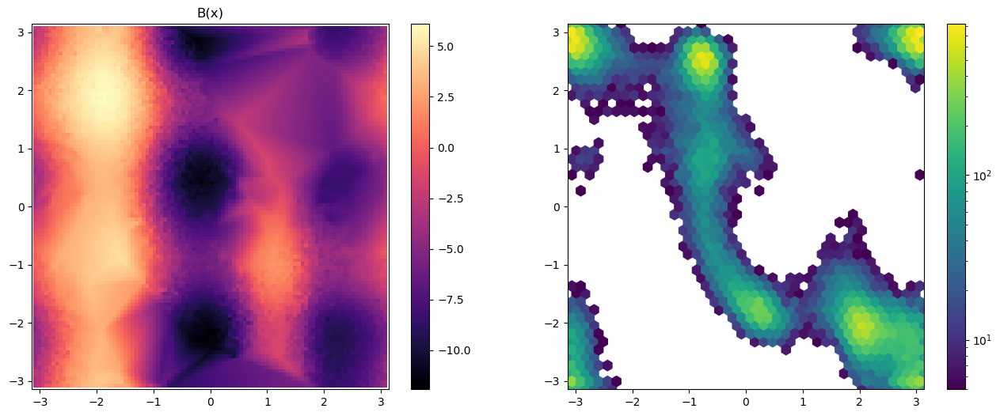

Iter:  44 l_f: 974.981 l_s: 403.144925 lr:  3e-07 success:  0.59833336


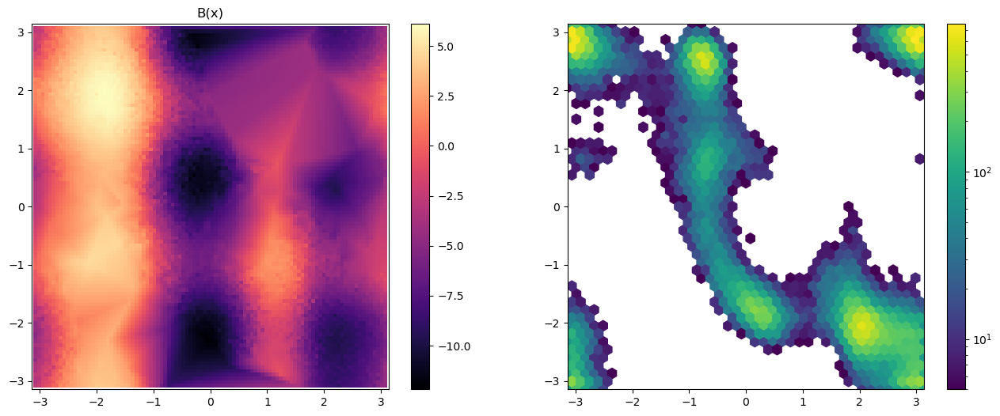

Iter:  45 l_f: 877.6297 l_s: 370.42265 lr:  3e-07 success:  0.585


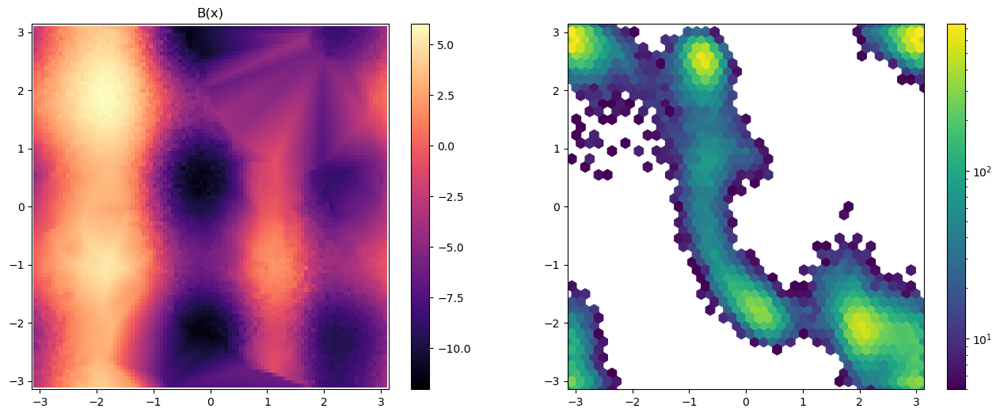

Iter:  46 l_f: 857.2059 l_s: 382.19695 lr:  3e-07 success:  0.61


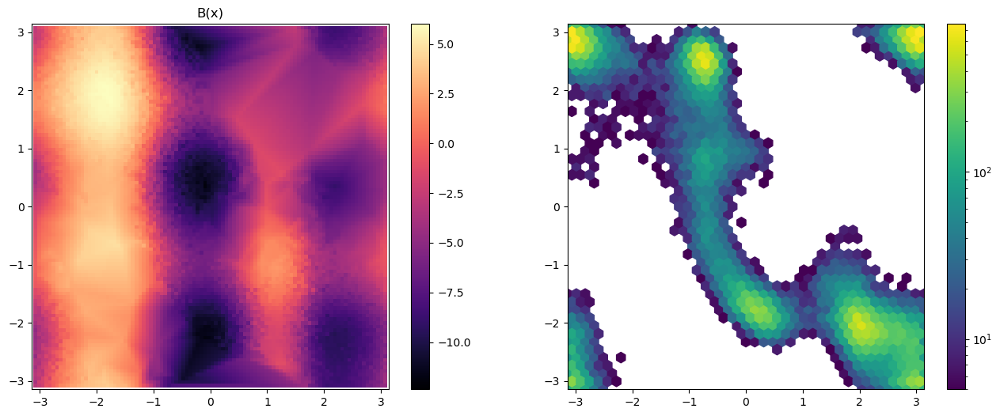

Iter:  47 l_f: 738.0785 l_s: 370.21125 lr:  3e-07 success:  0.64


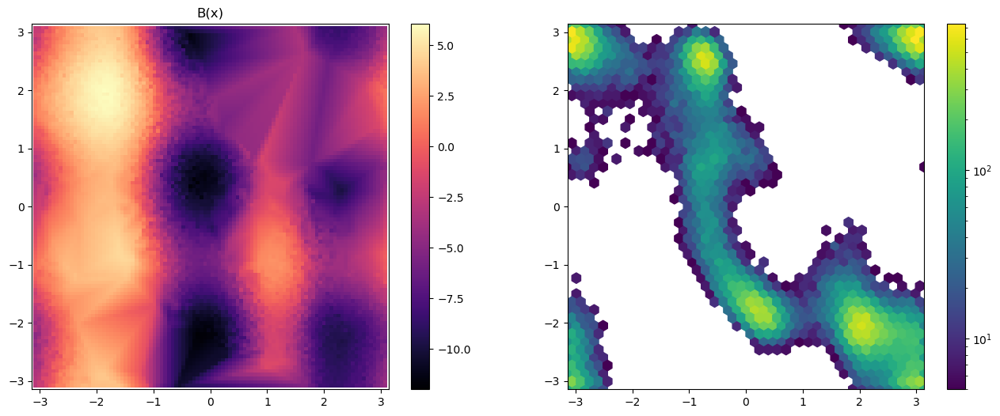

Iter:  48 l_f: 741.2691 l_s: 423.22645 lr:  3e-07 success:  0.645


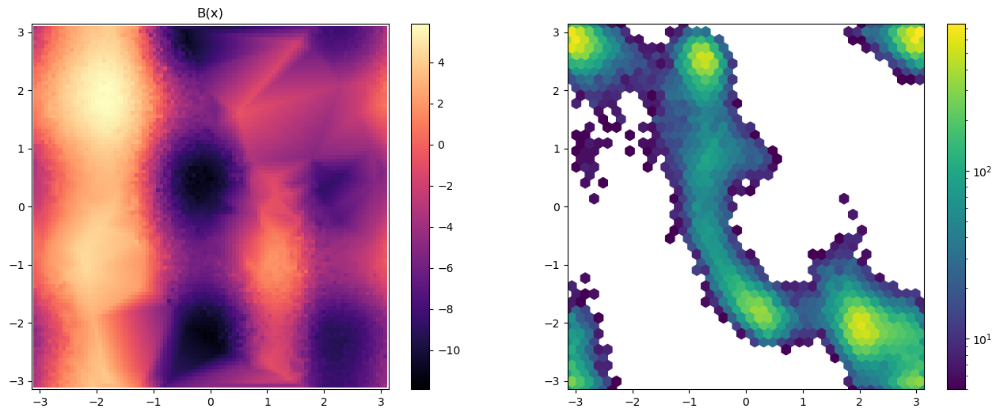

Iter:  49 l_f: 770.10255 l_s: 392.59515 lr:  3e-07 success:  0.645


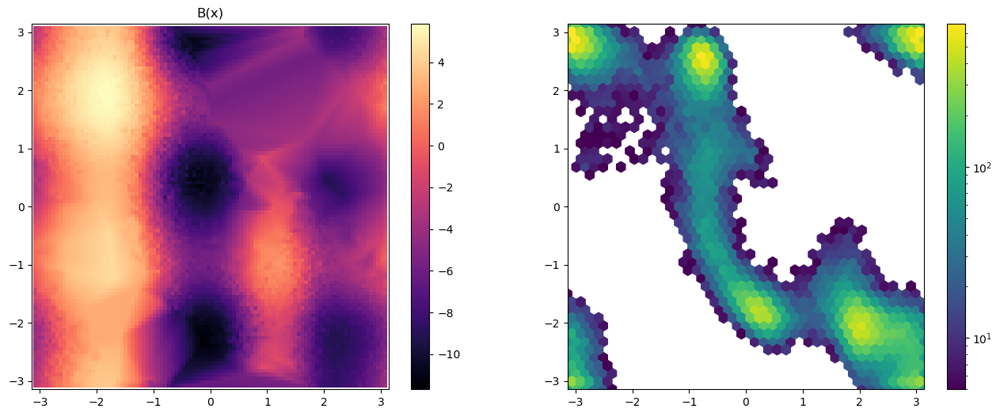

Iter:  50 l_f: 872.8524 l_s: 351.7984 lr:  3e-07 success:  0.6066667


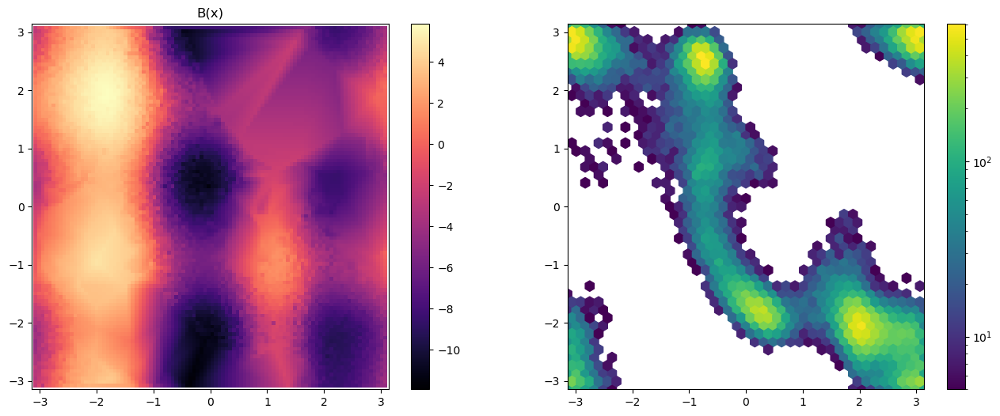

Iter:  51 l_f: 700.2166 l_s: 390.0539 lr:  3e-07 success:  0.68


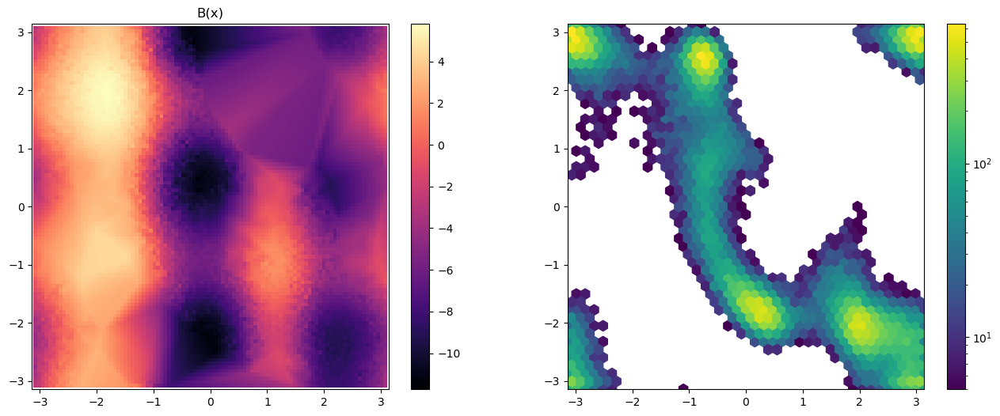

Iter:  52 l_f: 856.576 l_s: 401.657725 lr:  3e-07 success:  0.62


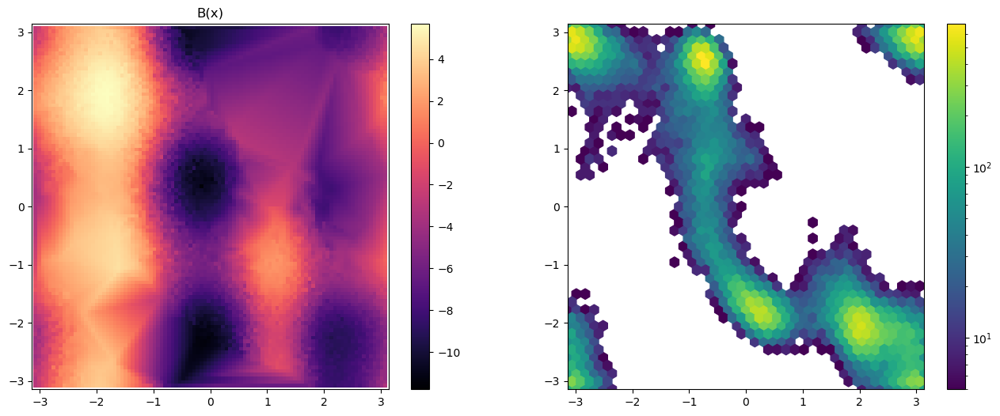

Iter:  53 l_f: 892.9103 l_s: 440.7219 lr:  3e-07 success:  0.63166666


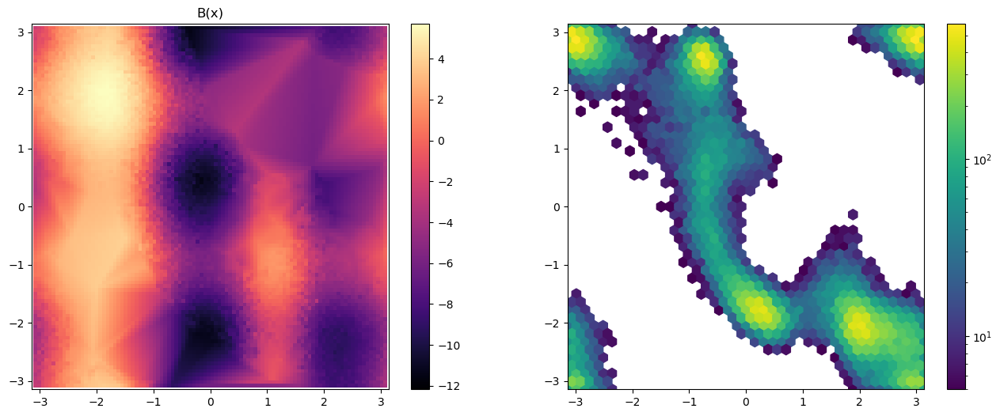

Iter:  54 l_f: 783.8668 l_s: 379.035275 lr:  3e-07 success:  0.65


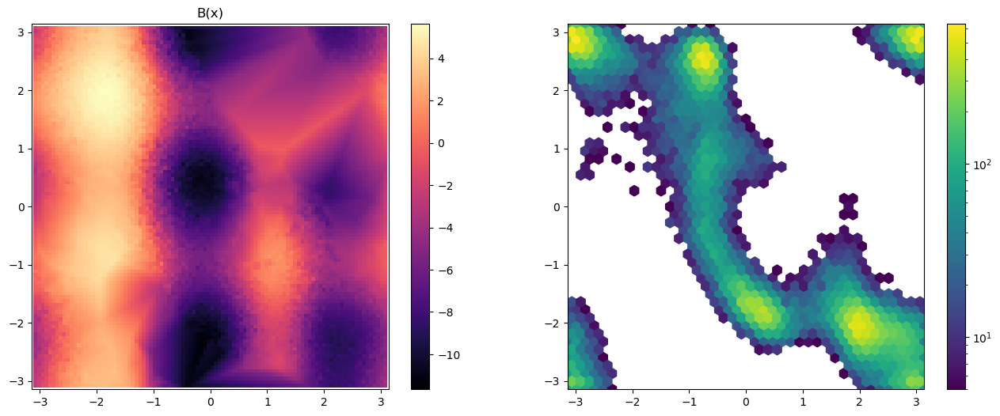

Iter:  55 l_f: 653.8762 l_s: 378.50005 lr:  3e-07 success:  0.665


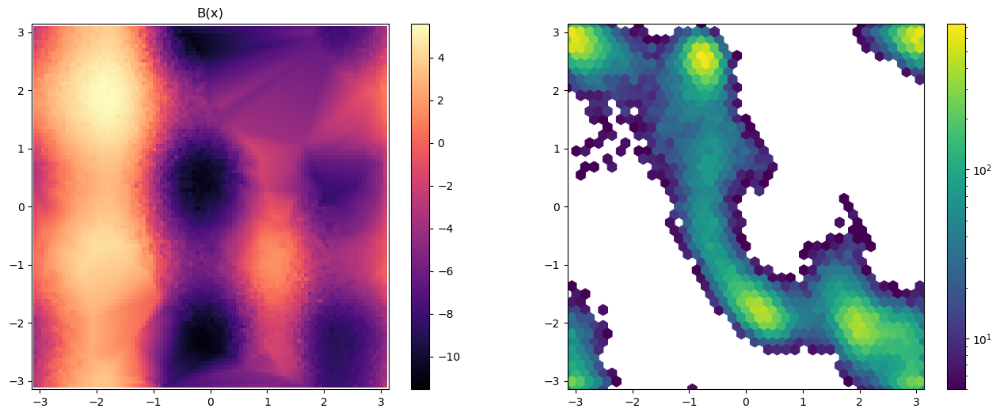

Iter:  56 l_f: 841.9608 l_s: 394.560275 lr:  3e-07 success:  0.655


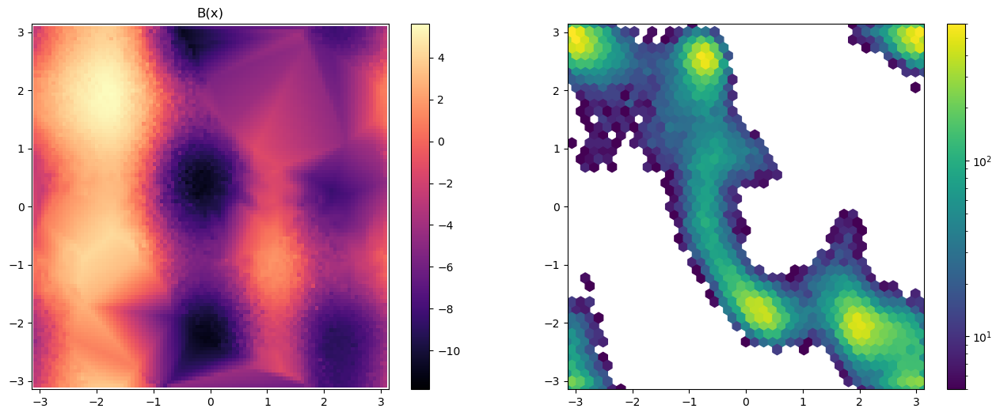

Iter:  57 l_f: 724.511 l_s: 373.427925 lr:  3e-07 success:  0.6716667


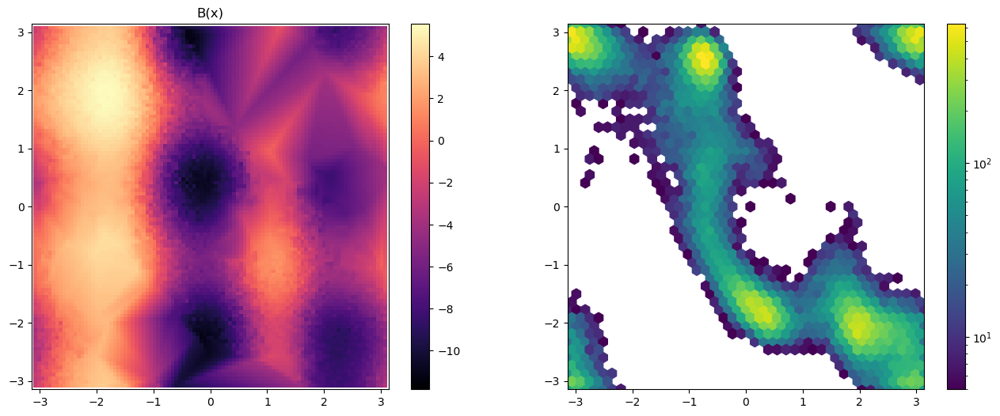

Iter:  58 l_f: 720.97865 l_s: 360.27935 lr:  3e-07 success:  0.6816667


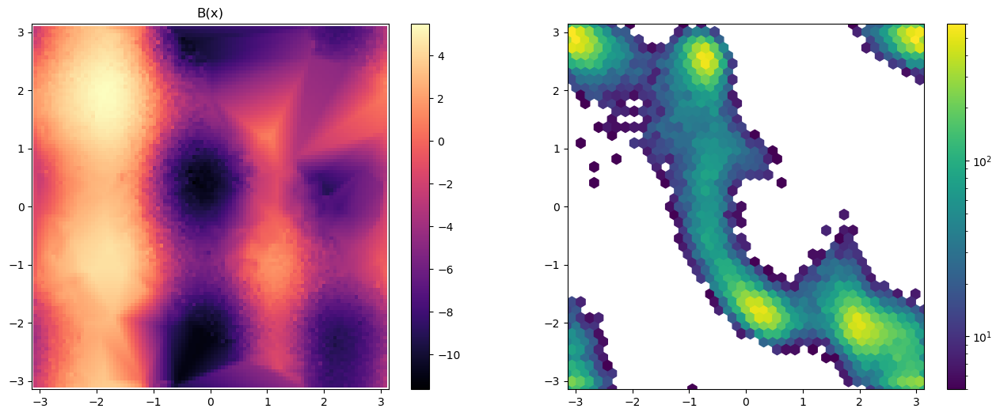

Iter:  59 l_f: 716.3672 l_s: 477.8481 lr:  3e-07 success:  0.6766667


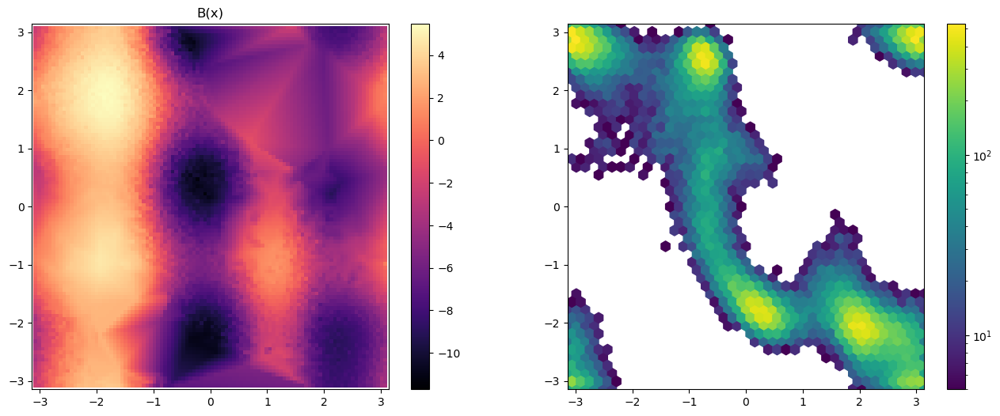

Iter:  60 l_f: 619.1551 l_s: 431.79285 lr:  3e-07 success:  0.6816667


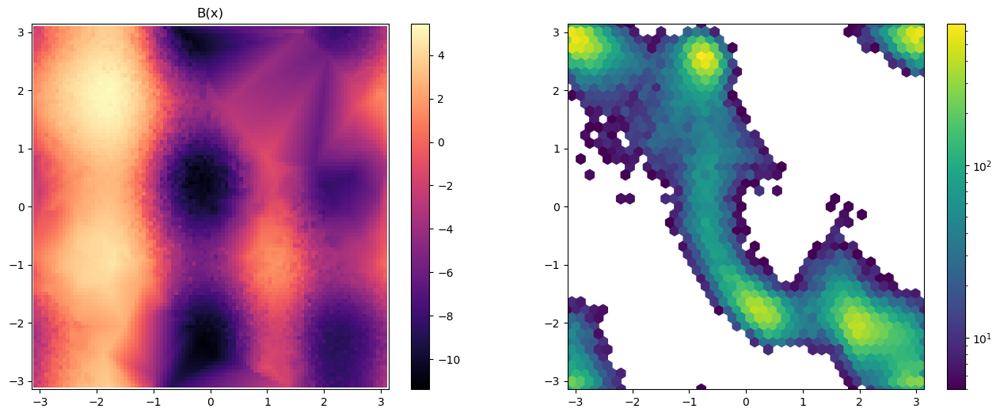

Iter:  61 l_f: 657.42455 l_s: 430.08855 lr:  3e-07 success:  0.6766667


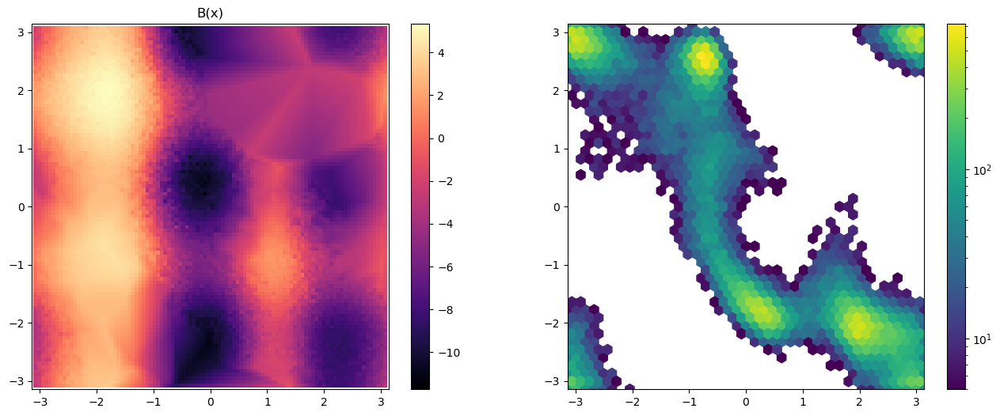

Iter:  62 l_f: 852.4587 l_s: 435.23885 lr:  3e-07 success:  0.675


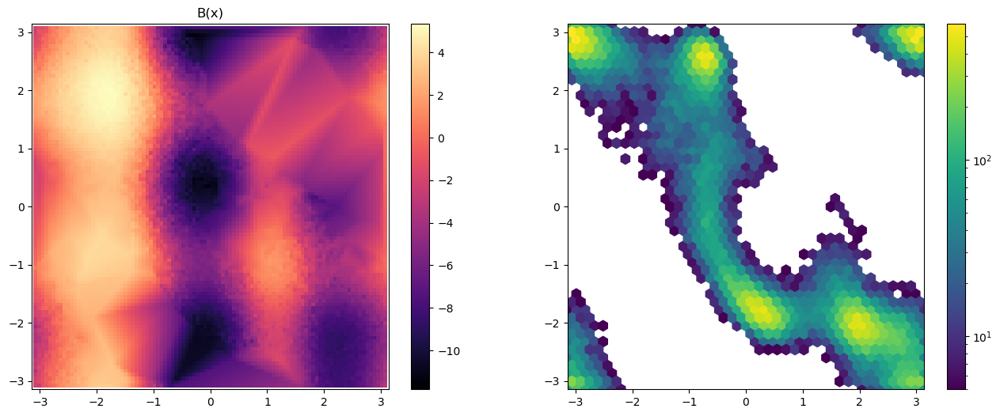

Iter:  63 l_f: 698.8021 l_s: 479.70515 lr:  3e-07 success:  0.67


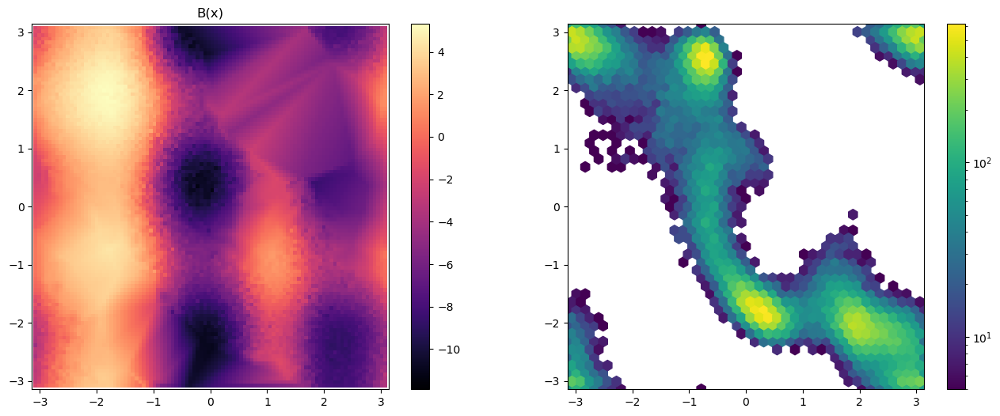

In [ ]:
losses_forward, losses_start, lrs, successes = [], [], [], []

#sample_bias_force.load_state_dict(torch.load(args.folder+"modelGood.pt"))


with open(args.folder+'logs.txt', 'w') as f:
    while i < args.epochs+1:
        i = i+1
        #Get init and end point, running for a short time
        system, simulation_init, simulation_end = get_init_point()
        
        #Move to CPU for loss calculations For optimized version will stay on GPU
        simulation_init = simulation_init.cpu()
        simulation_end = simulation_end.cpu()

        #Run the main simulation loop
        trajectory, velocities_list, force_list = forward_simulate(system, vmaped_force, args)

        #Concated trajectory
        traj_tensor = torch.stack(trajectory, axis=1)
        traj_desc = dihedral_descriptors.get_descriptors(traj_tensor)        
        
        #Plot the quantities, like selected trajectories or PMF
        known_cvs = dihedral_descriptors.get_descriptors(traj_tensor)[...,0:2]

            
        if i % args.save_every_model == 0:
            plot_intermediate(traj_tensor, traj_desc, known_cvs, sample_bias_force, i, args, domain)
            torch.save(sample_bias_force.state_dict(), args.folder+"model" + str(i) + ".pt")
        
        #Get losses
        #loss_forward, loss_start, forward_indices, 
        lf, ls, f_I, aN, s_I, aN_start, success_rate = descriptor_loss.dist_loss_adjoint(traj_tensor, simulation_end, simulation_init)

        #Scale to avoid  numerical errors
        loss_forward = lf*adjoint_multiplier
        loss_start = ls*adjoint_multiplier
        if aN is not None:
            aN = aN*adjoint_multiplier
            aN_start = aN_start*adjoint_multiplier
        
        #Print some statistics
        stats = {}
        stats["iter"] = i
        stats["loss_fwd"] = loss_forward.detach().cpu().numpy()/adjoint_multiplier
        stats["loss_s"] = loss_start.detach().cpu().numpy()/adjoint_multiplier
        stats["lr"] = scheduler.get_last_lr()[0]
        stats["success"] = success_rate.cpu().numpy()
        
        logger.write_row(stats)
        print("Iter: ", i, "l_f:", stats["loss_fwd"], "l_s:", stats["loss_s"], "lr: ", stats["lr"], "success: ", stats["success"], flush=True)
        
        
        losses_forward.append(loss_forward.detach().cpu().numpy())
        losses_start.append(loss_start.detach().cpu().numpy())
        lrs.append(scheduler.get_last_lr()[0])
        successes.append(success_rate.detach().cpu().numpy())  
        
        #Learning rate scheduling based on success rate
        if success_rate >= first_thr and not first_checkpoint:
            first_checkpoint = True
            scheduler.step()
        if success_rate > second_thr and not second_checkpoint:
            second_checkpoint = True
            scheduler.step()

            
        if args.no_adjoint:
            #Differentiate trajectory and get adjoits by full backprop. Used for testing
            intermediate_grads = torch.autograd.grad(loss_forward, force_list, retain_graph=True, create_graph=False, allow_unused=True)
            intermediate_grads_start = torch.autograd.grad(loss_start, force_list, retain_graph=False, allow_unused=True)
            adjoints = torch.stack(intermediate_grads + intermediate_grads_start, dim=1)
            
            R_tensor = traj_tensor[:,:-1].detach().repeat(1,2,1,1)
            adjoints = adjoints.reshape(-1, *adjoints.shape[2:])
            R_tensor = R_tensor.reshape(-1, *adjoints.shape[2:])
  
            train_epoch(adjoints, R_tensor, bias_force, optimizer, n_in, args)

        else:
            #Use adjoint method to get adjoints. Memmory efficient.
            adjoints_forward, testR = get_adjoints(system, aN, traj_tensor, f_I, vmaped_vjp, system.M, args)
            adjoints_start, testR_start = get_adjoints(system, aN_start, traj_tensor, s_I, vmaped_vjp, system.M, args)

            
            adjoints = torch.cat((adjoints_forward.reshape(-1, *adjoints_forward.shape[2:]), adjoints_start.reshape(-1, *adjoints_start.shape[2:])))
            R_tensor = torch.cat((testR.reshape(-1,*testR.shape[2:]), testR_start.reshape(-1,*testR_start.shape[2:])))

            adjoints_filter = (adjoints.abs().sum((-2,-1))>1e-8)
            adjoints = adjoints[adjoints_filter]
            R_tensor = R_tensor[adjoints_filter]
            
            train_epoch(adjoints, R_tensor, sample_bias_force, optimizer, args.dimension, args)




   

In [ ]:
print(adjoints.shape)
print(testR.shape)
print(adjoints_forward.shape)
adjoints = torch.cat((adjoints_forward.reshape(-1, *adjoints_forward.shape[2:]), adjoints_start.reshape(-1, *adjoints_start.shape[2:])))
R_tensor = torch.cat((testR.reshape(-1,*testR.shape[2:]), testR_start.reshape(-1,*testR_start.shape[2:])))
print(R_tensor.shape)
print(adjoints)
#cpu_adjoints = adjoints.detach().cpu()

In [ ]:
#Plot success rates

plt.plot(successes)
plt.show()

In [ ]:
#Possibly take a look at the trajector in ASE

def get_ase_traj(traj_tensor):
    #Let us look at mol 0
    single_traj = traj_tensor[-1]
    ase_traj = []
    for im in single_traj:
        frame = asemol.copy()
        frame.positions = im
        ase_traj.append(frame)
        
    view(ase_traj) 

#get_ase_traj(traj_tensor)


In [ ]:
print(i)
known_descs = known_cvs.detach().cpu().reshape(-1,2)
plt.hexbin(known_descs[::10,0], known_descs[::10,1].detach().cpu(), cmap="viridis",gridsize=40, mincnt=5)
plt.colorbar()
plt.show()